# Imports

In [10]:
import pandas as pd
import json
import matplotlib.pyplot as plt
import numpy as np
from scipy.integrate import cumtrapz
import googlemaps
import os
import datetime
import pytz
from geopy.distance import geodesic
from operator import add
from IPython.display import display, HTML
%matplotlib inline

# Load and Preprocess - All ChargePoint Data

In [11]:
def load_preprocess_CP(filename, api_key):
    basename = os.path.splitext(filename)[0]
    if os.path.exists(basename + ".pkl"):
        print('-Loading from existing pickle file "{}"'.format(basename + '.pkl'))
        CP_df = pd.read_pickle(basename + ".pkl")
        
    else:
        print('-Creating new pickle file from "{}"'.format(filename))
        CP_df = pd.read_json(filename, lines=True)
        
        CP_df = add_latlng(CP_df, api_key)
        CP_df = add_vap(CP_df)
        
        CP_df.to_pickle(basename + '.pkl')

    return CP_df

def add_latlng(CP_df, api_key):
    # Warning:  makes Google Geolocation API requests, which costs money.
    zipcodes = CP_df['zip'].unique()
    print('---Adding latitude and longitude coordinates for {} zipcodes.'.format(len(zipcodes)))    
    gmaps = googlemaps.Client(api_key)
    
    CP_df['lat'] = np.nan
    CP_df['lng'] = np.nan
    limit = 1000
    for _, zipcode in zip(range(limit), zipcodes):
        geocode_result = gmaps.geocode(str(zipcode))
        CP_df.loc[CP_df['zip'] == zipcode, 'lat'] = geocode_result[0]['geometry']['location']['lat']
        CP_df.loc[CP_df['zip'] == zipcode, 'lng'] = geocode_result[0]['geometry']['location']['lng']
        if _ == limit - 1:
            print('-----WARNING:  not all requests were made, as there is a limit of {}. Dataframe will be incomplete.'.format(limit))
        
    return CP_df

def add_vap(CP_df):
    zipcodes = CP_df['zip'].unique()
    print('---Adding VAPs for {} zipcodes.'.format(len(zipcodes)))    
    
    zip_sublap_map_df = pd.read_csv('PGE-Zip-to-Sublap-Map_csv.csv', header=1)
    CP_df['VAP'] = np.nan
    for zipcode in zipcodes:
        sublaps = list(zip_sublap_map_df.loc[zip_sublap_map_df['SERVICE ZIP'] == zipcode, 'ZONE NAME'])

        if len(sublaps) == 1:
            vap = sublaps[0][-2:]
        else:
            vap = ''
            for sublap in sublaps:
                vap += sublap[-2:] + '-'
            vap = vap[:-1]
        CP_df.loc[CP_df['zip'] == zipcode, 'VAP'] = vap
        
    return CP_df
    
    
api_key = 'YOUR KEY HERE'
CP_df = load_preprocess_CP('ev_data_json.txt', api_key)

-Loading from existing pickle file "ev_data_json.pkl"


# Analysis

In [12]:
CP_df

,city,country,endTime,energy,intervals,sessionID,startTime,state,stationID,zip,lat,lng,VAP
0,Sonoma,United States,2013-01-01T01:49:36+00:00,1.345533,"[{'energyConsumed': 0.133237, 'rollingPowerAvg...",9798123,2013-01-01T01:27:23+00:00,California,37163,95476,38.231574,-122.469369,FG-NB
1,San Francisco,United States,2013-01-01T02:00:30-08:00,7.185141,"[{'energyConsumed': 1.272225, 'rollingPowerAvg...",9799543,2013-01-01T00:46:59-08:00,California,132,94102,37.778687,-122.421242,SF
2,Sonoma,United States,2013-01-01T02:12:32+00:00,1.311654,"[{'energyConsumed': 0.539381, 'rollingPowerAvg...",9798295,2013-01-01T01:50:54+00:00,California,37163,95476,38.231574,-122.469369,FG-NB
3,Santa Clara,United States,2013-01-01T02:41:35-08:00,1.183976,"[{'energyConsumed': 0.36841199999999996, 'roll...",9799671,2013-01-01T02:04:33-08:00,California,36123,95050,37.353966,-121.952999,SB
4,Emeryville,United States,2013-01-01T04:51:01-08:00,5.657668,"[{'energyConsumed': 0.757145, 'rollingPowerAvg...",9799709,2013-01-01T03:17:13-08:00,California,6202,94608,37.837959,-122.282402,EB
5,Campbell,United States,2013-01-01T05:02:35+00:00,0.160479,"[{'energyConsumed': 0.018324999999999998, 'rol...",9799003,2013-01-01T04:59:02+00:00,California,10239,95008,37.277003,-121.952999,P2-SB
6,Campbell,United States,2013-01-01T08:27:21+00:00,11.313373,"[{'energyConsumed': 0.653768, 'rollingPowerAvg...",9799013,2013-01-01T05:02:50+00:00,California,10239,95008,37.277003,-121.952999,P2-SB
7,San Francisco,United States,2013-01-01T09:14:17-08:00,6.330775,"[{'energyConsumed': 0.8540719999999999, 'rolli...",9799857,2013-01-01T07:30:47-08:00,California,8660,94158,37.774836,-122.387258,SF
8,Walnut Creek,United States,2013-01-01T09:26:15-08:00,14.643862,"[{'energyConsumed': 0.862506, 'rollingPowerAvg...",9799615,2013-01-01T01:15:46-08:00,California,9155,94597,37.919337,-122.078063,EB
9,San Francisco,United States,2013-01-01T09:29:44-08:00,10.929480,"[{'energyConsumed': 1.124029, 'rollingPowerAvg...",9799825,2013-01-01T07:03:26-08:00,California,132,94102,37.778687,-122.421242,SF


In [13]:
CP_df['VAP'].unique()

array(['FG-NB', 'SF', 'SB', 'EB', 'P2-SB', 'NP-SI', 'ZP', 'SI', 'EB-SB',
       'P2', 'NB', 'ST', '', 'CC', 'CC-P2', 'FG-NC', 'EB-SF', 'FG', 'NP',
       'EB-NB', 'HB', 'F1', 'EB-NP', 'NB-NP', 'F1-ZP', 'P2-SF', 'NC'],
      dtype=object)

In [14]:
CP_df['city'].unique()

array(['Sonoma', 'San Francisco', 'Santa Clara', 'Emeryville', 'Campbell',
       'Walnut Creek', 'Lafayette', 'Mountain View', 'Folsom', 'San Jose',
       'Anaheim', 'Solvang', 'Dublin', 'Los Altos Hills', 'Milpitas',
       'Alameda', 'Roseville', 'Fremont', 'Saratoga', 'San Rafael',
       'Concord', 'Cupertino', 'Mill Valley', 'Patterson', 'Palo Alto',
       'Pleasanton', 'Davis', 'Ventura', 'Monterey', 'Menlo Park',
       'Santa Cruz', 'Oakland', 'Napa', 'Aptos', 'Hayward',
       'Pleasant Hill', 'Geyserville', 'Brentwood', 'Los Gatos',
       'Tiburon', 'South San Francisco', 'Santa Barbara', 'Capitola',
       'Pittsburg', 'American Canyon', 'San Mateo', 'Redwood City',
       'San Bruno', 'Sunnyvale', 'San Leandro', 'Novato', 'Stanford',
       'Martinez', 'Santa Rosa', 'Newark', 'Richmond', 'Seaside',
       'Sausalito', 'Martinez ', 'Cotati', 'West Sacramento',
       'Scotts Valley', 'Rocklin', 'San Ramon', 'SF', 'Portola Valley',
       'Belmont', 'Castroville', 'Healds

In [15]:
def get_distance(latlng0, latlng1):
    # INPUTS:  latlng0, latlng1 are tuples containing floats; first lat, then lng
    # OUTPUTS:  geodesic distance between two (lat,lng) coordinates in miles
    return geodesic(latlng0, latlng1).miles

In [16]:
latlng0 = (CP_df['lat'][0], CP_df['lng'][0])
latlng1 = (CP_df['lat'][1], CP_df['lng'][1])
print(CP_df['zip'][0], CP_df['zip'][1])
print(latlng0, latlng1)
print(get_distance(latlng0, latlng1))

95476 94102
(38.2315738, -122.4693688) (37.7786871, -122.4212424)
31.345850826409183


In [17]:
def daily_charging_plots(CP_df, VAPs=[], stationIDs=[], zipcodes=[], mode='energyConsumed'):
    # INPUTS: must include CP_df and one or more of {VAPS, stationIDs, zipcodes}
    # stationIDs:  list of stationIDs
    # zipcodes: list of zip codes
    # mode (optional): 'energyConsumed', 'numVehConnected'
    
    if not VAPs and not stationIDs and not zipcodes:
        raise ValueError('No selector inputs specified.  Please specify which VAPs, stations, or zips to plot.')
    
    if mode != 'energyConsumed' and mode != 'numVehConnected':
        raise ValueError('Invalid mode.  Must be "energyConsumed" or "numVehConnected".')
    
    sub_df = CP_df[(CP_df['VAP'].isin(VAPs)) | (CP_df['stationID'].isin(stationIDs)) | CP_df['zip'].isin(zipcodes)]
    
    plot_dict = {}
    
    drop = 0
    if mode == 'energyConsumed':
        ylabel = 'Energy Consumed (kWh)'
        for session in sub_df['intervals']:
            for interval in session:
                ts = interval['stationTime']
                if interval['rollingPowerAvg'] > interval['peakPower']:
                    print(interval)
                    drop += 1
                    continue
                plot_dict[ts] = list(map(add, plot_dict.get(ts, [0, 0]), [interval['energyConsumed'], interval['rollingPowerAvg']]))

    else:
        ylabel = 'Number of Vehicles Connected'
        for session in sub_df['intervals']:
            for interval in session:
                ts = interval['stationTime']
                if interval['rollingPowerAvg'] > interval['peakPower']:
                    print(interval)
                    drop += 1
                    continue
                plot_dict[ts] = list(map(add, plot_dict.get(ts, [0, 0]), [1, interval['rollingPowerAvg']]))

    print('Dropped '+str(drop))
                

    plot_df = pd.DataFrame.from_dict(plot_dict, orient='index', columns=[mode, 'rollingPowerAvg'])
    plot_df.index = pd.to_datetime(plot_df.index)
    
    drop_indices = plot_df[plot_df.index < pd.to_datetime('2013')].index
    if len(drop_indices) != 0:
        old_len = len(plot_df)
        plot_df = plot_df.drop(drop_indices)
        print('Data cleaning: {} erroneous date labels (labels before year 2013).'.format(old_len - len(plot_df)))
        
    
    plot_df = plot_df.resample('15T').sum().dropna().tz_localize(pytz.utc).tz_convert(pytz.timezone('US/Pacific'))
    
    print(plot_df.median())
    
    limit = 20
    for _, (idx, day_plot_df) in zip(range(limit), plot_df.groupby(plot_df.index.date)):
        ax = day_plot_df.plot(secondary_y=['rollingPowerAvg'], style='.-', figsize=(10,5))
        ax.set_title('{} ({})'.format(str(idx), idx.strftime('%A')))
        ax.set_ylabel(ylabel)
        ax.right_ax.set_ylabel('Rolling Power Average (kW)')
        ax.set_xlim(pd.Timestamp(idx, tz='US/Pacific'), pd.Timestamp(idx, tz='US/Pacific') + pd.Timedelta('1 days'))

{'energyConsumed': 4.129765, 'rollingPowerAvg': 3.7417, 'stationTime': '2013-01-01T11:00:00-08:00', 'peakPower': 3.7066}
{'energyConsumed': 1.737235, 'rollingPowerAvg': 6.457, 'stationTime': '2013-01-01T11:45:00-08:00', 'peakPower': 6.2916}
{'energyConsumed': 5.00436, 'rollingPowerAvg': 3.7249, 'stationTime': '2013-01-01T09:00:00-08:00', 'peakPower': 3.7228}
{'energyConsumed': 6.86574, 'rollingPowerAvg': 3.725, 'stationTime': '2013-01-01T09:30:00-08:00', 'peakPower': 3.7226}
{'energyConsumed': 6.367442, 'rollingPowerAvg': 3.7241, 'stationTime': '2013-01-01T11:45:00-08:00', 'peakPower': 3.722}
{'energyConsumed': 7.298591, 'rollingPowerAvg': 3.7246, 'stationTime': '2013-01-01T12:00:00-08:00', 'peakPower': 3.7226}
{'energyConsumed': 5.178752, 'rollingPowerAvg': 3.6518, 'stationTime': '2013-01-01T12:15:00-08:00', 'peakPower': 3.6507}
{'energyConsumed': 5.048271, 'rollingPowerAvg': 3.642, 'stationTime': '2013-01-01T11:15:00-08:00', 'peakPower': 3.6399}
{'energyConsumed': 11.412775, 'rolling

{'energyConsumed': 14.629302, 'rollingPowerAvg': 3.6844, 'stationTime': '2013-01-02T12:45:00-08:00', 'peakPower': 3.6839}
{'energyConsumed': 15.051369, 'rollingPowerAvg': 3.6133, 'stationTime': '2013-01-02T15:30:00-08:00', 'peakPower': 3.5912}
{'energyConsumed': 1.095153, 'rollingPowerAvg': 2.2609, 'stationTime': '2013-01-02T15:30:00-08:00', 'peakPower': 2.257}
{'energyConsumed': 1.057079, 'rollingPowerAvg': 3.6284, 'stationTime': '2013-01-02T16:00:00-08:00', 'peakPower': 3.5686999999999998}
{'energyConsumed': 1.7735400000000001, 'rollingPowerAvg': 3.6415, 'stationTime': '2013-01-02T08:45:00-08:00', 'peakPower': 3.626}
{'energyConsumed': 3.584726, 'rollingPowerAvg': 3.6434, 'stationTime': '2013-01-02T09:15:00-08:00', 'peakPower': 3.6281}
{'energyConsumed': 5.394184, 'rollingPowerAvg': 3.6352, 'stationTime': '2013-01-02T09:45:00-08:00', 'peakPower': 3.6255}
{'energyConsumed': 9.00184, 'rollingPowerAvg': 3.6194, 'stationTime': '2013-01-02T10:45:00-08:00', 'peakPower': 3.6104000000000003}

{'energyConsumed': 10.674978, 'rollingPowerAvg': 3.6858, 'stationTime': '2013-01-05T16:45:00-08:00', 'peakPower': 3.6742}
{'energyConsumed': 1.280173, 'rollingPowerAvg': 3.602, 'stationTime': '2013-01-05T16:45:00-08:00', 'peakPower': 3.6017}
{'energyConsumed': 2.162541, 'rollingPowerAvg': 3.7039999999999997, 'stationTime': '2013-01-05T18:30:00-08:00', 'peakPower': 3.6967}
{'energyConsumed': 2.714566, 'rollingPowerAvg': 2.2767, 'stationTime': '2013-01-05T18:45:00-08:00', 'peakPower': 2.2697}
{'energyConsumed': 4.448455, 'rollingPowerAvg': 3.1385, 'stationTime': '2013-01-05T19:00:00-08:00', 'peakPower': 3.0298}
{'energyConsumed': 1.32456, 'rollingPowerAvg': 3.7161, 'stationTime': '2013-01-05T19:45:00-08:00', 'peakPower': 3.7003}
{'energyConsumed': 1.5927470000000001, 'rollingPowerAvg': 3.7484, 'stationTime': '2013-01-05T20:30:00-08:00', 'peakPower': 3.748}
{'energyConsumed': 2.221238, 'rollingPowerAvg': 3.746, 'stationTime': '2013-01-05T20:45:00-08:00', 'peakPower': 3.7454}
{'energyConsu

{'energyConsumed': 8.483581, 'rollingPowerAvg': 3.7448, 'stationTime': '2013-01-10T11:00:00-08:00', 'peakPower': 3.7436}
{'energyConsumed': 5.3e-05, 'rollingPowerAvg': 0.0002, 'stationTime': '2013-01-10T08:45:00-08:00', 'peakPower': 0.0}
{'energyConsumed': 9.465653, 'rollingPowerAvg': 3.5549, 'stationTime': '2013-01-10T12:00:00-08:00', 'peakPower': 3.5115}
{'energyConsumed': 3.6536489999999997, 'rollingPowerAvg': 3.6867, 'stationTime': '2013-01-10T08:45:00-08:00', 'peakPower': 3.681}
{'energyConsumed': 5.666587, 'rollingPowerAvg': 3.7289, 'stationTime': '2013-01-10T12:00:00-08:00', 'peakPower': 3.7172}
{'energyConsumed': 9.226543, 'rollingPowerAvg': 3.1541, 'stationTime': '2013-01-10T12:15:00-08:00', 'peakPower': 3.0762}
{'energyConsumed': 9.004906, 'rollingPowerAvg': 3.7442, 'stationTime': '2013-01-10T11:15:00-08:00', 'peakPower': 3.7431}
{'energyConsumed': 9.447443, 'rollingPowerAvg': 3.7125, 'stationTime': '2013-01-10T11:00:00-08:00', 'peakPower': 3.7113}
{'energyConsumed': 7.290917

{'energyConsumed': 6.939235, 'rollingPowerAvg': 3.5119, 'stationTime': '2013-01-16T11:15:00-08:00', 'peakPower': 3.5109}
{'energyConsumed': 28.781919, 'rollingPowerAvg': 6.2521, 'stationTime': '2013-01-16T16:00:00-08:00', 'peakPower': 6.2512}
{'energyConsumed': 8.774958999999999, 'rollingPowerAvg': 3.7419000000000002, 'stationTime': '2013-01-16T11:00:00-08:00', 'peakPower': 3.7405}
{'energyConsumed': 1.6031909999999998, 'rollingPowerAvg': 3.7687, 'stationTime': '2013-01-16T18:30:00-08:00', 'peakPower': 3.7575000000000003}
{'energyConsumed': 8.241323, 'rollingPowerAvg': 3.6148, 'stationTime': '2013-01-16T17:00:00-08:00', 'peakPower': 3.6138}
{'energyConsumed': 2.714727, 'rollingPowerAvg': 3.7306, 'stationTime': '2013-01-16T13:30:00-08:00', 'peakPower': 3.7298999999999998}
{'energyConsumed': 10.190185, 'rollingPowerAvg': 3.7474, 'stationTime': '2013-01-16T15:30:00-08:00', 'peakPower': 3.7465}
{'energyConsumed': 13.299119, 'rollingPowerAvg': 3.8214, 'stationTime': '2013-01-16T18:45:00-08:

{'energyConsumed': 0.9778319999999999, 'rollingPowerAvg': 3.7258, 'stationTime': '2013-01-24T07:30:00-08:00', 'peakPower': 3.7168}
{'energyConsumed': 9.370926, 'rollingPowerAvg': 3.7481, 'stationTime': '2013-01-24T09:45:00-08:00', 'peakPower': 3.7405}
{'energyConsumed': 3.817894, 'rollingPowerAvg': 3.7269, 'stationTime': '2013-01-24T09:30:00-08:00', 'peakPower': 3.7251000000000003}
{'energyConsumed': 10.3343, 'rollingPowerAvg': 3.7276, 'stationTime': '2013-01-24T11:15:00-08:00', 'peakPower': 3.7257}
{'energyConsumed': 2.488107, 'rollingPowerAvg': 3.7880000000000003, 'stationTime': '2013-01-24T12:30:09-08:00', 'peakPower': 3.7484}
{'energyConsumed': 5.558071, 'rollingPowerAvg': 3.7082, 'stationTime': '2013-01-24T09:15:00-08:00', 'peakPower': 3.7059}
{'energyConsumed': 8.460328, 'rollingPowerAvg': 3.7121, 'stationTime': '2013-01-24T11:45:00-08:00', 'peakPower': 3.7113}
{'energyConsumed': 12.434518, 'rollingPowerAvg': 3.7179, 'stationTime': '2013-01-24T13:00:00-08:00', 'peakPower': 3.7058

{'energyConsumed': 11.534884, 'rollingPowerAvg': 3.7458, 'stationTime': '2013-01-31T11:15:00-08:00', 'peakPower': 3.7443}
{'energyConsumed': 0.554415, 'rollingPowerAvg': 3.0065, 'stationTime': '2013-01-31T18:30:00-08:00', 'peakPower': 2.9952}
{'energyConsumed': 4.423268, 'rollingPowerAvg': 3.7287, 'stationTime': '2013-01-31T16:30:00-08:00', 'peakPower': 3.7272}
{'energyConsumed': 3.910714, 'rollingPowerAvg': 3.7187, 'stationTime': '2013-01-31T11:45:00-08:00', 'peakPower': 3.7166}
{'energyConsumed': 13.184889, 'rollingPowerAvg': 3.7111, 'stationTime': '2013-01-31T14:15:00-08:00', 'peakPower': 3.7099}
{'energyConsumed': 5.479438, 'rollingPowerAvg': 3.735, 'stationTime': '2013-01-31T11:15:00-08:00', 'peakPower': 3.7332}
{'energyConsumed': 13.86285, 'rollingPowerAvg': 3.7257, 'stationTime': '2013-01-31T13:30:00-08:00', 'peakPower': 3.7251000000000003}
{'energyConsumed': 2.203584, 'rollingPowerAvg': 2.2784, 'stationTime': '2013-01-31T18:45:00-08:00', 'peakPower': 2.2472}
{'energyConsumed': 

{'energyConsumed': 9.117833, 'rollingPowerAvg': 3.6293, 'stationTime': '2013-02-07T10:15:00-08:00', 'peakPower': 3.6234}
{'energyConsumed': 10.918491, 'rollingPowerAvg': 3.6225, 'stationTime': '2013-02-07T10:45:00-08:00', 'peakPower': 3.6111}
{'energyConsumed': 12.719474, 'rollingPowerAvg': 3.6189999999999998, 'stationTime': '2013-02-07T11:15:00-08:00', 'peakPower': 3.6092}
{'energyConsumed': 6.990402, 'rollingPowerAvg': 3.2633, 'stationTime': '2013-02-07T17:45:00-08:00', 'peakPower': 3.0058}
{'energyConsumed': 3.741832, 'rollingPowerAvg': 3.7468, 'stationTime': '2013-02-07T08:45:00-08:00', 'peakPower': 3.7457000000000003}
{'energyConsumed': 2.1195019999999998, 'rollingPowerAvg': 3.7521, 'stationTime': '2013-02-07T08:45:00-08:00', 'peakPower': 3.751}
{'energyConsumed': 4.772027, 'rollingPowerAvg': 3.5843, 'stationTime': '2013-02-07T09:30:00-08:00', 'peakPower': 3.5836}
{'energyConsumed': 16.387514, 'rollingPowerAvg': 3.573, 'stationTime': '2013-02-07T12:45:00-08:00', 'peakPower': 3.571

{'energyConsumed': 12.961651, 'rollingPowerAvg': 3.5664, 'stationTime': '2013-02-14T17:15:00-08:00', 'peakPower': 3.5585}
{'energyConsumed': 4.7000000000000004e-05, 'rollingPowerAvg': 0.016900000000000002, 'stationTime': '2013-02-14T13:59:50-08:00', 'peakPower': 0.0}
{'energyConsumed': 2.04876, 'rollingPowerAvg': 3.7322, 'stationTime': '2013-02-14T10:30:00-08:00', 'peakPower': 3.7127}
{'energyConsumed': 8.513503, 'rollingPowerAvg': 3.6896, 'stationTime': '2013-02-14T12:15:00-08:00', 'peakPower': 3.6879}
{'energyConsumed': 2.258634, 'rollingPowerAvg': 3.739, 'stationTime': '2013-02-14T16:15:00-08:00', 'peakPower': 3.7379}
{'energyConsumed': 5.60178, 'rollingPowerAvg': 3.7442, 'stationTime': '2013-02-14T17:15:00-08:00', 'peakPower': 3.7333}
{'energyConsumed': 4.218379, 'rollingPowerAvg': 3.6853, 'stationTime': '2013-02-14T13:45:00-08:00', 'peakPower': 3.6827}
{'energyConsumed': 5.809355, 'rollingPowerAvg': 3.0642, 'stationTime': '2013-02-14T15:30:00-08:00', 'peakPower': 3.0611}
{'energyC

{'energyConsumed': 11.069164, 'rollingPowerAvg': 3.0283, 'stationTime': '2013-02-22T11:00:00-08:00', 'peakPower': 3.026}
{'energyConsumed': 6.058435, 'rollingPowerAvg': 3.1348, 'stationTime': '2013-02-22T11:45:00-08:00', 'peakPower': 3.1334}
{'energyConsumed': 6.849869, 'rollingPowerAvg': 3.6934, 'stationTime': '2013-02-22T12:15:00-08:00', 'peakPower': 3.1732}
{'energyConsumed': 7.164627, 'rollingPowerAvg': 3.2312, 'stationTime': '2013-02-22T12:15:00-08:00', 'peakPower': 3.2132}
{'energyConsumed': 4.285472, 'rollingPowerAvg': 3.6274, 'stationTime': '2013-02-22T10:00:00-08:00', 'peakPower': 3.6257}
{'energyConsumed': 0.894921, 'rollingPowerAvg': 4.3041, 'stationTime': '2013-02-22T12:30:00-08:00', 'peakPower': 3.789}
{'energyConsumed': 7.372029, 'rollingPowerAvg': 5.5502, 'stationTime': '2013-02-22T10:00:00-08:00', 'peakPower': 5.5361}
{'energyConsumed': 10.128025, 'rollingPowerAvg': 5.5374, 'stationTime': '2013-02-22T10:30:00-08:00', 'peakPower': 5.5268}
{'energyConsumed': 12.891246, 'r

{'energyConsumed': 1.4666190000000001, 'rollingPowerAvg': 3.6067, 'stationTime': '2013-03-01T09:30:00-08:00', 'peakPower': 3.6062000000000003}
{'energyConsumed': 2.403538, 'rollingPowerAvg': 4.7486, 'stationTime': '2013-03-01T13:15:15-08:00', 'peakPower': 3.7412}
{'energyConsumed': 4.734319, 'rollingPowerAvg': 3.6913, 'stationTime': '2013-03-01T12:45:00-08:00', 'peakPower': 3.6901}
{'energyConsumed': 8.074408, 'rollingPowerAvg': 3.7002, 'stationTime': '2013-03-01T12:45:00-08:00', 'peakPower': 3.6976}
{'energyConsumed': 2.206576, 'rollingPowerAvg': 3.7942, 'stationTime': '2013-03-01T13:15:00-08:00', 'peakPower': 3.752}
{'energyConsumed': 3.491672, 'rollingPowerAvg': 3.6316, 'stationTime': '2013-03-01T13:15:00-08:00', 'peakPower': 3.6236}
{'energyConsumed': 3.203882, 'rollingPowerAvg': 3.7705, 'stationTime': '2013-03-01T13:15:00-08:00', 'peakPower': 3.7323}
{'energyConsumed': 1.027562, 'rollingPowerAvg': 3.6135, 'stationTime': '2013-03-01T12:45:06-08:00', 'peakPower': 3.6067}
{'energyCon

{'energyConsumed': 12.690403, 'rollingPowerAvg': 6.0066, 'stationTime': '2013-03-07T13:15:00-08:00', 'peakPower': 6.002}
{'energyConsumed': 7.128527, 'rollingPowerAvg': 3.7526, 'stationTime': '2013-03-07T10:00:00-08:00', 'peakPower': 3.7511}
{'energyConsumed': 14.622505, 'rollingPowerAvg': 3.7500999999999998, 'stationTime': '2013-03-07T12:00:00-08:00', 'peakPower': 3.7485}
{'energyConsumed': 16.495171, 'rollingPowerAvg': 3.7494, 'stationTime': '2013-03-07T12:30:00-08:00', 'peakPower': 3.7485}
{'energyConsumed': 8.167414, 'rollingPowerAvg': 3.1401, 'stationTime': '2013-03-07T14:00:00-08:00', 'peakPower': 3.13}
{'energyConsumed': 4.450666, 'rollingPowerAvg': 3.6857, 'stationTime': '2013-03-07T09:30:00-08:00', 'peakPower': 3.6845}
{'energyConsumed': 10.89555, 'rollingPowerAvg': 3.6862, 'stationTime': '2013-03-07T11:15:00-08:00', 'peakPower': 3.6839}
{'energyConsumed': 17.338627, 'rollingPowerAvg': 3.6846, 'stationTime': '2013-03-07T13:00:00-08:00', 'peakPower': 3.6832000000000003}
{'energ

{'energyConsumed': 1.2998669999999999, 'rollingPowerAvg': 3.6165000000000003, 'stationTime': '2013-03-13T09:15:00-07:00', 'peakPower': 3.6078}
{'energyConsumed': 3.103885, 'rollingPowerAvg': 3.6261, 'stationTime': '2013-03-13T09:45:00-07:00', 'peakPower': 3.616}
{'energyConsumed': 5.250685, 'rollingPowerAvg': 3.7482, 'stationTime': '2013-03-13T10:00:00-07:00', 'peakPower': 3.7463}
{'energyConsumed': 1.7546339999999998, 'rollingPowerAvg': 3.6953, 'stationTime': '2013-03-13T08:30:00-07:00', 'peakPower': 3.6952}
{'energyConsumed': 5.440093, 'rollingPowerAvg': 3.6853, 'stationTime': '2013-03-13T09:30:00-07:00', 'peakPower': 3.6835}
{'energyConsumed': 8.535072, 'rollingPowerAvg': 3.6016, 'stationTime': '2013-03-13T16:15:00-07:00', 'peakPower': 3.6015}
{'energyConsumed': 3.154075, 'rollingPowerAvg': 3.6921, 'stationTime': '2013-03-13T19:30:00-07:00', 'peakPower': 3.6712}
{'energyConsumed': 6.85696, 'rollingPowerAvg': 3.7307, 'stationTime': '2013-03-13T14:15:00-07:00', 'peakPower': 3.7285}
{'

{'energyConsumed': 6.617885, 'rollingPowerAvg': 3.7420999999999998, 'stationTime': '2013-03-18T13:00:00-07:00', 'peakPower': 3.7405}
{'energyConsumed': 10.356664, 'rollingPowerAvg': 3.7412, 'stationTime': '2013-03-18T14:00:00-07:00', 'peakPower': 3.7399}
{'energyConsumed': 1.978863, 'rollingPowerAvg': 3.5943, 'stationTime': '2013-03-18T12:30:00-07:00', 'peakPower': 3.5793}
{'energyConsumed': 3.767495, 'rollingPowerAvg': 3.5935, 'stationTime': '2013-03-18T13:00:00-07:00', 'peakPower': 3.5826000000000002}
{'energyConsumed': 5.557451, 'rollingPowerAvg': 3.5963000000000003, 'stationTime': '2013-03-18T13:30:00-07:00', 'peakPower': 3.5846}
{'energyConsumed': 7.348674, 'rollingPowerAvg': 3.5999, 'stationTime': '2013-03-18T14:00:00-07:00', 'peakPower': 3.5833}
{'energyConsumed': 10.031027, 'rollingPowerAvg': 3.586, 'stationTime': '2013-03-18T14:45:00-07:00', 'peakPower': 3.585}
{'energyConsumed': 11.822614, 'rollingPowerAvg': 3.5878, 'stationTime': '2013-03-18T15:15:00-07:00', 'peakPower': 3.5

{'energyConsumed': 3.649783, 'rollingPowerAvg': 3.7261, 'stationTime': '2013-03-22T14:15:00-07:00', 'peakPower': 3.7242}
{'energyConsumed': 7.396463, 'rollingPowerAvg': 6.1995000000000005, 'stationTime': '2013-03-22T15:00:00-07:00', 'peakPower': 6.1406}
{'energyConsumed': 5.024539, 'rollingPowerAvg': 3.6201, 'stationTime': '2013-03-22T13:15:00-07:00', 'peakPower': 3.6193}
{'energyConsumed': 5.837239, 'rollingPowerAvg': 3.6076, 'stationTime': '2013-03-22T09:00:00-07:00', 'peakPower': 3.607}
{'energyConsumed': 7.737864, 'rollingPowerAvg': 3.5409, 'stationTime': '2013-03-22T14:45:00-07:00', 'peakPower': 3.5349}
{'energyConsumed': 2.815638, 'rollingPowerAvg': 3.7089, 'stationTime': '2013-03-22T09:15:00-07:00', 'peakPower': 3.7079}
{'energyConsumed': 10.222404, 'rollingPowerAvg': 3.7066, 'stationTime': '2013-03-22T11:15:00-07:00', 'peakPower': 3.7053000000000003}
{'energyConsumed': 4.418351, 'rollingPowerAvg': 3.6152, 'stationTime': '2013-03-22T13:00:00-07:00', 'peakPower': 3.6135}
{'energy

{'energyConsumed': 7.006849, 'rollingPowerAvg': 3.7538, 'stationTime': '2013-03-28T18:00:00-07:00', 'peakPower': 3.7504}
{'energyConsumed': 1.476884, 'rollingPowerAvg': 2.2328, 'stationTime': '2013-03-28T20:00:00-07:00', 'peakPower': 2.2198}
{'energyConsumed': 5.438898, 'rollingPowerAvg': 3.7325, 'stationTime': '2013-03-28T16:45:00-07:00', 'peakPower': 3.7312000000000003}
{'energyConsumed': 7.924743, 'rollingPowerAvg': 3.7348, 'stationTime': '2013-03-28T20:15:00-07:00', 'peakPower': 3.6332}
{'energyConsumed': 12.907353, 'rollingPowerAvg': 5.7393, 'stationTime': '2013-03-28T10:15:00-07:00', 'peakPower': 5.7232}
{'energyConsumed': 6.824133, 'rollingPowerAvg': 3.6142000000000003, 'stationTime': '2013-03-28T20:45:00-07:00', 'peakPower': 3.5856}
{'energyConsumed': 6.731215, 'rollingPowerAvg': 3.7008, 'stationTime': '2013-03-28T18:00:00-07:00', 'peakPower': 3.6986}
{'energyConsumed': 3.972955, 'rollingPowerAvg': 6.0592, 'stationTime': '2013-03-28T19:30:07-07:00', 'peakPower': 6.0388}
{'energ

{'energyConsumed': 3.333634, 'rollingPowerAvg': 3.5884, 'stationTime': '2013-04-04T10:45:00-07:00', 'peakPower': 3.5876}
{'energyConsumed': 10.504144, 'rollingPowerAvg': 3.5895, 'stationTime': '2013-04-04T12:45:00-07:00', 'peakPower': 3.5888999999999998}
{'energyConsumed': 5.23762, 'rollingPowerAvg': 3.6025, 'stationTime': '2013-04-04T10:00:00-07:00', 'peakPower': 3.6015}
{'energyConsumed': 9.226874, 'rollingPowerAvg': 3.61, 'stationTime': '2013-04-04T12:30:00-07:00', 'peakPower': 3.609}
{'energyConsumed': 4.7000000000000004e-05, 'rollingPowerAvg': 0.0051, 'stationTime': '2013-04-04T15:29:27-07:00', 'peakPower': 0.0}
{'energyConsumed': 4.974347, 'rollingPowerAvg': 3.6313, 'stationTime': '2013-04-04T16:15:00-07:00', 'peakPower': 3.6303}
{'energyConsumed': 11.428852, 'rollingPowerAvg': 3.5786, 'stationTime': '2013-04-04T12:00:00-07:00', 'peakPower': 3.578}
{'energyConsumed': 3.0606, 'rollingPowerAvg': 0.0001, 'stationTime': '2013-04-04T12:00:00-07:00', 'peakPower': 0.0}
{'energyConsumed'

{'energyConsumed': 5.394748, 'rollingPowerAvg': 3.7527, 'stationTime': '2013-04-10T20:00:00-07:00', 'peakPower': 3.7491}
{'energyConsumed': 3.594239, 'rollingPowerAvg': 3.2566, 'stationTime': '2013-04-10T20:15:00-07:00', 'peakPower': 3.058}
{'energyConsumed': 3.330627, 'rollingPowerAvg': 3.7012, 'stationTime': '2013-04-10T09:45:00-07:00', 'peakPower': 3.6996}
{'energyConsumed': 11.825469, 'rollingPowerAvg': 3.8986, 'stationTime': '2013-04-10T20:45:00-07:00', 'peakPower': 3.7929}
{'energyConsumed': 1.346017, 'rollingPowerAvg': 3.0465, 'stationTime': '2013-04-10T18:00:10-07:00', 'peakPower': 3.0292}
{'energyConsumed': 4.341877, 'rollingPowerAvg': 3.0388, 'stationTime': '2013-04-10T19:00:10-07:00', 'peakPower': 3.0293}
{'energyConsumed': 5.59061, 'rollingPowerAvg': 3.6957, 'stationTime': '2013-04-10T21:15:00-07:00', 'peakPower': 3.6918}
{'energyConsumed': 9.820698, 'rollingPowerAvg': 3.1717, 'stationTime': '2013-04-10T22:15:00-07:00', 'peakPower': 3.1709}
{'energyConsumed': 11.936776, 'ro

{'energyConsumed': 4.676636, 'rollingPowerAvg': 3.7177, 'stationTime': '2013-04-16T09:15:00-07:00', 'peakPower': 3.7162}
{'energyConsumed': 2.9231030000000002, 'rollingPowerAvg': 3.7636000000000003, 'stationTime': '2013-04-16T18:45:00-07:00', 'peakPower': 3.7573}
{'energyConsumed': 3.289634, 'rollingPowerAvg': 3.6971, 'stationTime': '2013-04-16T17:45:00-07:00', 'peakPower': 3.6967}
{'energyConsumed': 5.133967, 'rollingPowerAvg': 3.692, 'stationTime': '2013-04-16T18:15:00-07:00', 'peakPower': 3.69}
{'energyConsumed': 6.603295, 'rollingPowerAvg': 3.7121, 'stationTime': '2013-04-16T18:45:00-07:00', 'peakPower': 3.688}
{'energyConsumed': 1.492019, 'rollingPowerAvg': 1.3644, 'stationTime': '2013-04-16T11:45:00-07:00', 'peakPower': 1.3639999999999999}
{'energyConsumed': 3.87604, 'rollingPowerAvg': 1.3627, 'stationTime': '2013-04-16T13:30:00-07:00', 'peakPower': 1.3621}
{'energyConsumed': 7.435193, 'rollingPowerAvg': 1.4838, 'stationTime': '2013-04-16T16:00:00-07:00', 'peakPower': 1.4835}
{'e

{'energyConsumed': 9.294881, 'rollingPowerAvg': 3.1001, 'stationTime': '2013-04-23T10:00:12-07:00', 'peakPower': 3.0755}
{'energyConsumed': 12.34753, 'rollingPowerAvg': 3.0883, 'stationTime': '2013-04-23T11:00:12-07:00', 'peakPower': 3.0564}
{'energyConsumed': 1.909317, 'rollingPowerAvg': 3.2298, 'stationTime': '2013-04-23T11:30:00-07:00', 'peakPower': 3.0985}
{'energyConsumed': 5.94253, 'rollingPowerAvg': 3.7256, 'stationTime': '2013-04-23T11:30:00-07:00', 'peakPower': 3.6942}
{'energyConsumed': 7.098159, 'rollingPowerAvg': 3.6870000000000003, 'stationTime': '2013-04-23T10:00:00-07:00', 'peakPower': 3.6856}
{'energyConsumed': 14.149813, 'rollingPowerAvg': 5.9108, 'stationTime': '2013-04-23T11:45:00-07:00', 'peakPower': 5.9097}
{'energyConsumed': 2.913785, 'rollingPowerAvg': 3.6375, 'stationTime': '2013-04-22T19:45:07-07:00', 'peakPower': 3.6231}
{'energyConsumed': 6.53217, 'rollingPowerAvg': 3.6491, 'stationTime': '2013-04-22T20:45:07-07:00', 'peakPower': 3.6319}
{'energyConsumed': 1.

{'energyConsumed': 8e-06, 'rollingPowerAvg': 0.0024000000000000002, 'stationTime': '2013-04-29T10:44:48-07:00', 'peakPower': 0.0}
{'energyConsumed': 4.646442, 'rollingPowerAvg': 3.84, 'stationTime': '2013-04-29T13:15:00-07:00', 'peakPower': 3.7242}
{'energyConsumed': 4.596523, 'rollingPowerAvg': 3.1646, 'stationTime': '2013-04-29T13:15:00-07:00', 'peakPower': 3.1543}
{'energyConsumed': 12.991579, 'rollingPowerAvg': 2.8486000000000002, 'stationTime': '2013-04-29T13:15:00-07:00', 'peakPower': 2.84}
{'energyConsumed': 3.892942, 'rollingPowerAvg': 4.119, 'stationTime': '2013-04-29T13:30:00-07:00', 'peakPower': 3.7189}
{'energyConsumed': 8.086711, 'rollingPowerAvg': 3.0838, 'stationTime': '2013-04-25T07:15:06-07:00', 'peakPower': 3.071}
{'energyConsumed': 7.140275, 'rollingPowerAvg': 7.0457, 'stationTime': '2013-04-29T13:30:00-07:00', 'peakPower': 6.5317}
{'energyConsumed': 11.330856, 'rollingPowerAvg': 3.7211, 'stationTime': '2013-04-29T10:30:00-07:00', 'peakPower': 3.7079}
{'energyConsume

{'energyConsumed': 5.288877, 'rollingPowerAvg': 3.6047000000000002, 'stationTime': '2013-05-06T08:30:00-07:00', 'peakPower': 3.6035}
{'energyConsumed': 3.980699, 'rollingPowerAvg': 3.7265, 'stationTime': '2013-05-06T10:15:00-07:00', 'peakPower': 3.7248}
{'energyConsumed': 2.51294, 'rollingPowerAvg': 3.7204, 'stationTime': '2013-05-06T11:30:00-07:00', 'peakPower': 3.6439}
{'energyConsumed': 1.649414, 'rollingPowerAvg': 3.4926, 'stationTime': '2013-05-06T08:00:00-07:00', 'peakPower': 3.4922}
{'energyConsumed': 9.491931, 'rollingPowerAvg': 3.4826, 'stationTime': '2013-05-06T10:15:00-07:00', 'peakPower': 3.4813}
{'energyConsumed': 6.373044, 'rollingPowerAvg': 3.7812, 'stationTime': '2013-05-06T11:30:00-07:00', 'peakPower': 3.7787}
{'energyConsumed': 4.331367, 'rollingPowerAvg': 3.6284, 'stationTime': '2013-05-06T09:45:00-07:00', 'peakPower': 3.6281}
{'energyConsumed': 10.567228, 'rollingPowerAvg': 3.6259, 'stationTime': '2013-05-06T11:30:00-07:00', 'peakPower': 3.6241}
{'energyConsumed': 9

{'energyConsumed': 7.470356, 'rollingPowerAvg': 3.7626, 'stationTime': '2013-05-11T16:45:00-07:00', 'peakPower': 3.7465}
{'energyConsumed': 9.338829, 'rollingPowerAvg': 3.758, 'stationTime': '2013-05-11T17:15:00-07:00', 'peakPower': 3.7402}
{'energyConsumed': 2.426254, 'rollingPowerAvg': 3.7416, 'stationTime': '2013-05-11T17:45:00-07:00', 'peakPower': 3.7403}
{'energyConsumed': 0.000107, 'rollingPowerAvg': 0.0241, 'stationTime': '2013-05-11T18:29:44-07:00', 'peakPower': 0.0}
{'energyConsumed': 2.252461, 'rollingPowerAvg': 5.7724, 'stationTime': '2013-05-11T21:30:00-07:00', 'peakPower': 5.7649}
{'energyConsumed': 8.371164, 'rollingPowerAvg': 3.7109, 'stationTime': '2013-05-11T21:30:00-07:00', 'peakPower': 3.7099}
{'energyConsumed': 9.529169, 'rollingPowerAvg': 3.7201, 'stationTime': '2013-05-11T22:00:00-07:00', 'peakPower': 3.7079}
{'energyConsumed': 3.527328, 'rollingPowerAvg': 3.7143, 'stationTime': '2013-05-11T22:15:00-07:00', 'peakPower': 3.7132}
{'energyConsumed': 4.414171, 'rollin

{'energyConsumed': 3.630043, 'rollingPowerAvg': 3.7329, 'stationTime': '2013-05-17T14:00:00-07:00', 'peakPower': 3.7309}
{'energyConsumed': 12.000944, 'rollingPowerAvg': 3.7185, 'stationTime': '2013-05-17T16:15:00-07:00', 'peakPower': 3.7168}
{'energyConsumed': 12.930274, 'rollingPowerAvg': 3.7173, 'stationTime': '2013-05-17T16:30:00-07:00', 'peakPower': 3.7154}
{'energyConsumed': 1.1000000000000001e-05, 'rollingPowerAvg': 0.0021000000000000003, 'stationTime': '2013-05-17T15:14:41-07:00', 'peakPower': 0.0}
{'energyConsumed': 52.474728, 'rollingPowerAvg': 6.0999, 'stationTime': '2013-05-17T17:45:00-07:00', 'peakPower': 6.0951}
{'energyConsumed': 6.292431, 'rollingPowerAvg': 3.729, 'stationTime': '2013-05-17T14:45:00-07:00', 'peakPower': 3.7271}
{'energyConsumed': 8.15479, 'rollingPowerAvg': 3.7287, 'stationTime': '2013-05-17T15:15:00-07:00', 'peakPower': 3.7263}
{'energyConsumed': 11.049202, 'rollingPowerAvg': 3.7175000000000002, 'stationTime': '2013-05-17T16:30:00-07:00', 'peakPower': 

{'energyConsumed': 5.846247, 'rollingPowerAvg': 5.6764, 'stationTime': '2013-05-24T09:45:00-07:00', 'peakPower': 5.5799}
{'energyConsumed': 6e-06, 'rollingPowerAvg': 0.0002, 'stationTime': '2013-05-24T09:51:25-07:00', 'peakPower': 0.0}
{'energyConsumed': 7.441865, 'rollingPowerAvg': 3.6343, 'stationTime': '2013-05-24T07:30:00-07:00', 'peakPower': 3.6306000000000003}
{'energyConsumed': 11.069128, 'rollingPowerAvg': 3.6457, 'stationTime': '2013-05-24T08:30:00-07:00', 'peakPower': 3.6358}
{'energyConsumed': 1.521885, 'rollingPowerAvg': 5.9584, 'stationTime': '2013-05-24T08:15:00-07:00', 'peakPower': 5.9453}
{'energyConsumed': 11.044109, 'rollingPowerAvg': 1.4361000000000002, 'stationTime': '2013-05-24T10:15:00-07:00', 'peakPower': 1.3653}
{'energyConsumed': 1.013368, 'rollingPowerAvg': 3.7075, 'stationTime': '2013-05-24T09:30:00-07:00', 'peakPower': 3.7074}
{'energyConsumed': 11.459166, 'rollingPowerAvg': 5.9875, 'stationTime': '2013-05-24T10:45:00-07:00', 'peakPower': 5.9409}
{'energyCon

{'energyConsumed': 11.924684, 'rollingPowerAvg': 3.7251000000000003, 'stationTime': '2013-05-31T12:45:00-07:00', 'peakPower': 3.7119999999999997}
{'energyConsumed': 11.853969, 'rollingPowerAvg': 3.682, 'stationTime': '2013-05-31T12:45:00-07:00', 'peakPower': 3.6722}
{'energyConsumed': 6.102899, 'rollingPowerAvg': 3.7013, 'stationTime': '2013-05-31T11:00:00-07:00', 'peakPower': 3.7002}
{'energyConsumed': 6.593203, 'rollingPowerAvg': 3.7162, 'stationTime': '2013-05-31T12:15:00-07:00', 'peakPower': 3.7137000000000002}
{'energyConsumed': 6.972301, 'rollingPowerAvg': 5.9598, 'stationTime': '2013-05-31T09:45:00-07:00', 'peakPower': 5.9494}
{'energyConsumed': 7.318202, 'rollingPowerAvg': 3.7106, 'stationTime': '2013-05-31T08:15:00-07:00', 'peakPower': 3.7086}
{'energyConsumed': 1.042388, 'rollingPowerAvg': 3.7326, 'stationTime': '2013-05-31T13:30:00-07:00', 'peakPower': 3.0354}
{'energyConsumed': 1.352583, 'rollingPowerAvg': 3.9198, 'stationTime': '2013-05-31T13:30:00-07:00', 'peakPower': 3.6

{'energyConsumed': 8.068334, 'rollingPowerAvg': 3.1345, 'stationTime': '2013-06-06T15:30:00-07:00', 'peakPower': 3.129}
{'energyConsumed': 3.839365, 'rollingPowerAvg': 6.2362, 'stationTime': '2013-06-06T10:38:59-07:00', 'peakPower': 6.1959}
{'energyConsumed': 8.888865, 'rollingPowerAvg': 3.6465, 'stationTime': '2013-06-06T15:00:00-07:00', 'peakPower': 3.6461}
{'energyConsumed': 4.264596, 'rollingPowerAvg': 3.6322, 'stationTime': '2013-06-06T10:00:00-07:00', 'peakPower': 3.6182}
{'energyConsumed': 7.916214, 'rollingPowerAvg': 3.6732, 'stationTime': '2013-06-06T11:00:00-07:00', 'peakPower': 3.6677}
{'energyConsumed': 6.1929549999999995, 'rollingPowerAvg': 3.6823, 'stationTime': '2013-06-06T15:00:00-07:00', 'peakPower': 3.6808}
{'energyConsumed': 12.625595, 'rollingPowerAvg': 3.6769, 'stationTime': '2013-06-06T16:45:00-07:00', 'peakPower': 3.6749}
{'energyConsumed': 5.638694, 'rollingPowerAvg': 3.682, 'stationTime': '2013-06-06T14:28:58-07:00', 'peakPower': 3.5235000000000003}
{'energyCon

{'energyConsumed': 6.078708, 'rollingPowerAvg': 5.672, 'stationTime': '2013-06-13T15:00:00-07:00', 'peakPower': 5.5801}
{'energyConsumed': 0.164563, 'rollingPowerAvg': 3.6357, 'stationTime': '2013-06-13T15:15:00-07:00', 'peakPower': 3.602}
{'energyConsumed': 13.864522000000001, 'rollingPowerAvg': 3.7226, 'stationTime': '2013-06-13T15:15:00-07:00', 'peakPower': 3.6578}
{'energyConsumed': 2.094714, 'rollingPowerAvg': 3.616, 'stationTime': '2013-06-13T07:30:00-07:00', 'peakPower': 3.6116}
{'energyConsumed': 6.994674, 'rollingPowerAvg': 6.5113, 'stationTime': '2013-06-13T15:15:00-07:00', 'peakPower': 6.506}
{'energyConsumed': 3.999009, 'rollingPowerAvg': 3.0407, 'stationTime': '2013-06-13T13:15:00-07:00', 'peakPower': 3.0374}
{'energyConsumed': 2.391281, 'rollingPowerAvg': 6.0311, 'stationTime': '2013-06-13T10:15:00-07:00', 'peakPower': 6.0309}
{'energyConsumed': 15.885382, 'rollingPowerAvg': 6.0293, 'stationTime': '2013-06-13T12:30:00-07:00', 'peakPower': 6.015}
{'energyConsumed': 5.85812

{'energyConsumed': 1.453309, 'rollingPowerAvg': 3.6023, 'stationTime': '2013-06-19T22:00:00-07:00', 'peakPower': 3.5888999999999998}
{'energyConsumed': 7.418194, 'rollingPowerAvg': 3.7318, 'stationTime': '2013-06-19T20:45:00-07:00', 'peakPower': 3.7315}
{'energyConsumed': 3.236364, 'rollingPowerAvg': 3.6023, 'stationTime': '2013-06-19T22:00:00-07:00', 'peakPower': 3.602}
{'energyConsumed': 2.440311, 'rollingPowerAvg': 6.5139, 'stationTime': '2013-06-20T00:00:00+00:00', 'peakPower': 6.5120000000000005}
{'energyConsumed': 6.309258, 'rollingPowerAvg': 6.5307, 'stationTime': '2013-06-20T00:45:00+00:00', 'peakPower': 6.5173}
{'energyConsumed': 53.820728, 'rollingPowerAvg': 6.6477, 'stationTime': '2013-06-20T06:15:00-07:00', 'peakPower': 6.622}
{'energyConsumed': 0.533743, 'rollingPowerAvg': 3.605, 'stationTime': '2013-06-20T06:30:00-07:00', 'peakPower': 3.5949999999999998}
{'energyConsumed': 5.287321, 'rollingPowerAvg': 3.7102, 'stationTime': '2013-06-18T17:30:00-07:00', 'peakPower': 3.709}

{'energyConsumed': 4.972753, 'rollingPowerAvg': 3.7641, 'stationTime': '2013-06-26T14:30:00-07:00', 'peakPower': 3.7471}
{'energyConsumed': 6.844079, 'rollingPowerAvg': 3.759, 'stationTime': '2013-06-26T15:00:00-07:00', 'peakPower': 3.7452}
{'energyConsumed': 8.715699, 'rollingPowerAvg': 3.7598000000000003, 'stationTime': '2013-06-26T15:30:00-07:00', 'peakPower': 3.7457000000000003}
{'energyConsumed': 2.69261, 'rollingPowerAvg': 3.8205999999999998, 'stationTime': '2013-06-26T16:15:00-07:00', 'peakPower': 3.6266}
{'energyConsumed': 4.811852, 'rollingPowerAvg': 3.7285, 'stationTime': '2013-06-26T14:15:00-07:00', 'peakPower': 3.7271}
{'energyConsumed': 3.699709, 'rollingPowerAvg': 3.7142, 'stationTime': '2013-06-26T14:15:00-07:00', 'peakPower': 3.7122}
{'energyConsumed': 2.680086, 'rollingPowerAvg': 3.745, 'stationTime': '2013-06-26T12:30:00-07:00', 'peakPower': 3.7441}
{'energyConsumed': 8.281389, 'rollingPowerAvg': 3.7345, 'stationTime': '2013-06-26T14:00:00-07:00', 'peakPower': 3.7329}

{'energyConsumed': 2.10689, 'rollingPowerAvg': 3.133, 'stationTime': '2013-07-03T15:00:00-07:00', 'peakPower': 2.9969}
{'energyConsumed': 1.487104, 'rollingPowerAvg': 3.6881, 'stationTime': '2013-07-03T15:00:00-07:00', 'peakPower': 3.6436}
{'energyConsumed': 12.441304, 'rollingPowerAvg': 3.3048, 'stationTime': '2013-07-03T15:15:00-07:00', 'peakPower': 3.2607}
{'energyConsumed': 9.948744, 'rollingPowerAvg': 6.4156, 'stationTime': '2013-07-03T15:15:00-07:00', 'peakPower': 6.3678}
{'energyConsumed': 8.513412, 'rollingPowerAvg': 3.6061, 'stationTime': '2013-07-03T13:00:00-07:00', 'peakPower': 3.6048999999999998}
{'energyConsumed': 1.757614, 'rollingPowerAvg': 2.8952, 'stationTime': '2013-07-03T15:30:00-07:00', 'peakPower': 2.8612}
{'energyConsumed': 1.372144, 'rollingPowerAvg': 3.2343, 'stationTime': '2013-07-03T15:45:00-07:00', 'peakPower': 3.0999}
{'energyConsumed': 5.217374, 'rollingPowerAvg': 3.6196, 'stationTime': '2013-07-03T12:45:00-07:00', 'peakPower': 3.6183}
{'energyConsumed': 11

{'energyConsumed': 2.925074, 'rollingPowerAvg': 3.7094, 'stationTime': '2013-07-11T15:30:00-07:00', 'peakPower': 3.7069}
{'energyConsumed': 4.765855, 'rollingPowerAvg': 3.7016999999999998, 'stationTime': '2013-07-11T16:00:00-07:00', 'peakPower': 3.6989}
{'energyConsumed': 2.764832, 'rollingPowerAvg': 3.7296, 'stationTime': '2013-07-11T13:30:00-07:00', 'peakPower': 3.7287}
{'energyConsumed': 11.135108, 'rollingPowerAvg': 3.7207, 'stationTime': '2013-07-11T15:45:00-07:00', 'peakPower': 3.7196}
{'energyConsumed': 6.04797, 'rollingPowerAvg': 3.7647, 'stationTime': '2013-07-11T09:15:00-07:00', 'peakPower': 3.7628}
{'energyConsumed': 5.594771, 'rollingPowerAvg': 3.6356, 'stationTime': '2013-07-11T16:30:00-07:00', 'peakPower': 3.6231}
{'energyConsumed': 7.40736, 'rollingPowerAvg': 3.6438, 'stationTime': '2013-07-11T17:00:00-07:00', 'peakPower': 3.6262}
{'energyConsumed': 8.802284, 'rollingPowerAvg': 3.6637, 'stationTime': '2013-07-11T17:30:00-07:00', 'peakPower': 3.6283000000000003}
{'energyC

{'energyConsumed': 3.946099, 'rollingPowerAvg': 3.7439999999999998, 'stationTime': '2013-07-17T17:30:00-07:00', 'peakPower': 3.7424}
{'energyConsumed': 3.971142, 'rollingPowerAvg': 3.7237999999999998, 'stationTime': '2013-07-17T18:30:00-07:00', 'peakPower': 3.7223}
{'energyConsumed': 10.09882, 'rollingPowerAvg': 3.7339, 'stationTime': '2013-07-17T20:15:00-07:00', 'peakPower': 3.7285}
{'energyConsumed': 1.233731, 'rollingPowerAvg': 3.0418, 'stationTime': '2013-07-17T09:30:00-07:00', 'peakPower': 3.035}
{'energyConsumed': 4.260614, 'rollingPowerAvg': 3.0378, 'stationTime': '2013-07-17T10:30:00-07:00', 'peakPower': 3.0375}
{'energyConsumed': 5.777167, 'rollingPowerAvg': 3.0471, 'stationTime': '2013-07-17T11:00:00-07:00', 'peakPower': 3.0401}
{'energyConsumed': 3.003195, 'rollingPowerAvg': 3.606, 'stationTime': '2013-07-17T18:15:00-07:00', 'peakPower': 3.6054}
{'energyConsumed': 1.793996, 'rollingPowerAvg': 3.3444000000000003, 'stationTime': '2013-07-17T15:30:00-07:00', 'peakPower': 3.3422

{'energyConsumed': 3.510697, 'rollingPowerAvg': 2.9486, 'stationTime': '2013-07-23T14:00:00-07:00', 'peakPower': 2.9434}
{'energyConsumed': 1.7724829999999998, 'rollingPowerAvg': 6.0315, 'stationTime': '2013-07-23T17:45:00-07:00', 'peakPower': 5.9436}
{'energyConsumed': 4.8e-05, 'rollingPowerAvg': 0.0002, 'stationTime': '2013-07-23T09:46:51-07:00', 'peakPower': 0.0}
{'energyConsumed': 9.406634, 'rollingPowerAvg': 3.7247, 'stationTime': '2013-07-23T16:15:00-07:00', 'peakPower': 3.7244}
{'energyConsumed': 2.728776, 'rollingPowerAvg': 1.3917, 'stationTime': '2013-07-23T10:45:00-07:00', 'peakPower': 1.3913}
{'energyConsumed': 8.29292, 'rollingPowerAvg': 1.3927, 'stationTime': '2013-07-23T14:45:00-07:00', 'peakPower': 1.3925}
{'energyConsumed': 10.031236, 'rollingPowerAvg': 1.3914, 'stationTime': '2013-07-23T16:00:00-07:00', 'peakPower': 1.3905}
{'energyConsumed': 19.598511, 'rollingPowerAvg': 6.2522, 'stationTime': '2013-07-23T18:00:00-07:00', 'peakPower': 6.1981}
{'energyConsumed': 5.4955

{'energyConsumed': 11.3195, 'rollingPowerAvg': 5.9126, 'stationTime': '2013-07-29T10:15:00-07:00', 'peakPower': 5.9077}
{'energyConsumed': 14.254714, 'rollingPowerAvg': 5.891, 'stationTime': '2013-07-29T10:45:00-07:00', 'peakPower': 5.8828}
{'energyConsumed': 0.9335469999999999, 'rollingPowerAvg': 3.6015, 'stationTime': '2013-07-29T13:15:00-07:00', 'peakPower': 3.6007}
{'energyConsumed': 7.2384830000000004, 'rollingPowerAvg': 3.6097, 'stationTime': '2013-07-29T15:00:00-07:00', 'peakPower': 3.6087}
{'energyConsumed': 5.205373, 'rollingPowerAvg': 3.0855, 'stationTime': '2013-07-29T10:45:00-07:00', 'peakPower': 3.0848}
{'energyConsumed': 5.974372, 'rollingPowerAvg': 3.076, 'stationTime': '2013-07-29T11:00:00-07:00', 'peakPower': 3.0703}
{'energyConsumed': 14.437728, 'rollingPowerAvg': 3.1201, 'stationTime': '2013-07-29T13:45:00-07:00', 'peakPower': 3.1174}
{'energyConsumed': 5.69749, 'rollingPowerAvg': 3.7102, 'stationTime': '2013-07-29T14:00:00-07:00', 'peakPower': 3.7089}
{'energyConsum

{'energyConsumed': 14.279284, 'rollingPowerAvg': 3.7066, 'stationTime': '2013-08-02T16:15:00-07:00', 'peakPower': 3.7053000000000003}
{'energyConsumed': 16.12989, 'rollingPowerAvg': 3.7046, 'stationTime': '2013-08-02T16:45:00-07:00', 'peakPower': 3.7039}
{'energyConsumed': 6.257329, 'rollingPowerAvg': 6.0247, 'stationTime': '2013-08-02T14:15:00-07:00', 'peakPower': 6.0086}
{'energyConsumed': 25.460346, 'rollingPowerAvg': 5.9806, 'stationTime': '2013-08-02T17:30:00-07:00', 'peakPower': 5.9779}
{'energyConsumed': 3.826648, 'rollingPowerAvg': 3.7869, 'stationTime': '2013-08-02T10:15:00-07:00', 'peakPower': 3.7707}
{'energyConsumed': 5.97021, 'rollingPowerAvg': 3.5597, 'stationTime': '2013-08-02T12:30:00-07:00', 'peakPower': 3.5571}
{'energyConsumed': 3.13628, 'rollingPowerAvg': 5.8508, 'stationTime': '2013-08-02T17:30:00-07:00', 'peakPower': 5.8435}
{'energyConsumed': 2.139697, 'rollingPowerAvg': 3.7285, 'stationTime': '2013-08-02T07:45:00-07:00', 'peakPower': 3.7263}
{'energyConsumed': 3

{'energyConsumed': 17.512428, 'rollingPowerAvg': 6.9322, 'stationTime': '2013-08-07T20:45:00-07:00', 'peakPower': 6.6731}
{'energyConsumed': 6.721789, 'rollingPowerAvg': 3.7245, 'stationTime': '2013-08-07T14:15:00-07:00', 'peakPower': 3.7228}
{'energyConsumed': 6.391919, 'rollingPowerAvg': 3.7307, 'stationTime': '2013-08-07T20:00:00-07:00', 'peakPower': 3.7298999999999998}
{'energyConsumed': 8.999048, 'rollingPowerAvg': 3.7271, 'stationTime': '2013-08-07T20:45:00-07:00', 'peakPower': 3.7251000000000003}
{'energyConsumed': 5.425769, 'rollingPowerAvg': 5.8593, 'stationTime': '2013-08-07T20:30:00-07:00', 'peakPower': 5.8586}
{'energyConsumed': 2.320882, 'rollingPowerAvg': 3.7341, 'stationTime': '2013-08-07T21:30:00-07:00', 'peakPower': 3.7237999999999998}
{'energyConsumed': 2.559977, 'rollingPowerAvg': 3.5907999999999998, 'stationTime': '2013-08-07T22:45:00-07:00', 'peakPower': 3.5764}
{'energyConsumed': 7.643111, 'rollingPowerAvg': 3.7341, 'stationTime': '2013-08-07T23:00:00-07:00', 'pea

{'energyConsumed': 0.843424, 'rollingPowerAvg': 1.6996, 'stationTime': '2013-08-13T08:15:00-07:00', 'peakPower': 1.6962000000000002}
{'energyConsumed': 1.69018, 'rollingPowerAvg': 1.7035, 'stationTime': '2013-08-13T08:45:00-07:00', 'peakPower': 1.6988}
{'energyConsumed': 6.753535, 'rollingPowerAvg': 1.6939000000000002, 'stationTime': '2013-08-13T11:45:00-07:00', 'peakPower': 1.6878000000000002}
{'energyConsumed': 15.492, 'rollingPowerAvg': 3.8412, 'stationTime': '2013-08-13T17:00:00-07:00', 'peakPower': 3.7264}
{'energyConsumed': 1.785197, 'rollingPowerAvg': 3.6274, 'stationTime': '2013-08-13T15:15:00-07:00', 'peakPower': 3.6265}
{'energyConsumed': 3.598091, 'rollingPowerAvg': 3.6432, 'stationTime': '2013-08-13T15:45:00-07:00', 'peakPower': 3.6384}
{'energyConsumed': 4.476158, 'rollingPowerAvg': 5.8191, 'stationTime': '2013-08-13T09:15:00-07:00', 'peakPower': 5.8022}
{'energyConsumed': 4.833543, 'rollingPowerAvg': 3.6129, 'stationTime': '2013-08-13T17:00:00-07:00', 'peakPower': 3.59630

{'energyConsumed': 4.314248, 'rollingPowerAvg': 6.5096, 'stationTime': '2013-08-19T09:00:00-07:00', 'peakPower': 6.5087}
{'energyConsumed': 13.231119, 'rollingPowerAvg': 3.6813000000000002, 'stationTime': '2013-08-19T11:45:00-07:00', 'peakPower': 3.5815}
{'energyConsumed': 3.9935419999999997, 'rollingPowerAvg': 3.6283000000000003, 'stationTime': '2013-08-19T11:45:00-07:00', 'peakPower': 3.5712}
{'energyConsumed': 4.825279, 'rollingPowerAvg': 3.7031, 'stationTime': '2013-08-19T12:00:00-07:00', 'peakPower': 3.6657}
{'energyConsumed': 2.7000000000000002e-05, 'rollingPowerAvg': 0.0009000000000000001, 'stationTime': '2013-08-19T12:02:21-07:00', 'peakPower': 0.0}
{'energyConsumed': 4.449356, 'rollingPowerAvg': 3.7065, 'stationTime': '2013-08-19T09:00:00-07:00', 'peakPower': 3.7051}
{'energyConsumed': 11.829391, 'rollingPowerAvg': 6.2972, 'stationTime': '2013-08-19T10:30:00-07:00', 'peakPower': 6.2943}
{'energyConsumed': 5.688439, 'rollingPowerAvg': 5.8997, 'stationTime': '2013-08-19T12:15:00

{'energyConsumed': 7.397951, 'rollingPowerAvg': 3.6254, 'stationTime': '2013-08-22T19:00:00-07:00', 'peakPower': 3.6245000000000003}
{'energyConsumed': 16.670919, 'rollingPowerAvg': 3.7085, 'stationTime': '2013-08-22T20:15:00-07:00', 'peakPower': 3.7079}
{'energyConsumed': 6.646872, 'rollingPowerAvg': 3.5958, 'stationTime': '2013-08-22T10:45:00-07:00', 'peakPower': 3.5954}
{'energyConsumed': 3.156902, 'rollingPowerAvg': 3.7464, 'stationTime': '2013-08-22T21:45:00-07:00', 'peakPower': 3.7226}
{'energyConsumed': 1.217981, 'rollingPowerAvg': 3.61, 'stationTime': '2013-08-22T21:45:00-07:00', 'peakPower': 3.6011}
{'energyConsumed': 9.882191, 'rollingPowerAvg': 3.7306, 'stationTime': '2013-08-22T20:45:00-07:00', 'peakPower': 3.7302}
{'energyConsumed': 3.291731, 'rollingPowerAvg': 3.6941, 'stationTime': '2013-08-22T21:15:00-07:00', 'peakPower': 3.6936}
{'energyConsumed': 2.702164, 'rollingPowerAvg': 2.5923, 'stationTime': '2013-08-22T20:00:00-07:00', 'peakPower': 2.5921000000000003}
{'energyC

{'energyConsumed': 3.033057, 'rollingPowerAvg': 6.1454, 'stationTime': '2013-08-28T12:30:00-07:00', 'peakPower': 6.1371}
{'energyConsumed': 5.330296, 'rollingPowerAvg': 6.1653, 'stationTime': '2013-08-28T13:00:00-07:00', 'peakPower': 6.1462}
{'energyConsumed': 4.885264, 'rollingPowerAvg': 5.9935, 'stationTime': '2013-08-28T11:15:00-07:00', 'peakPower': 5.9724}
{'energyConsumed': 7.86925, 'rollingPowerAvg': 6.0102, 'stationTime': '2013-08-28T11:45:00-07:00', 'peakPower': 5.9917}
{'energyConsumed': 2.596632, 'rollingPowerAvg': 3.7334, 'stationTime': '2013-08-28T10:00:00-07:00', 'peakPower': 3.7329}
{'energyConsumed': 3.175764, 'rollingPowerAvg': 3.6148, 'stationTime': '2013-08-28T11:00:00-07:00', 'peakPower': 3.6142000000000003}
{'energyConsumed': 5.221972, 'rollingPowerAvg': 3.5428, 'stationTime': '2013-08-28T13:15:00-07:00', 'peakPower': 3.5022}
{'energyConsumed': 3.21858, 'rollingPowerAvg': 3.7246, 'stationTime': '2013-08-28T13:00:00-07:00', 'peakPower': 3.724}
{'energyConsumed': 2.22

{'energyConsumed': 4.698236, 'rollingPowerAvg': 3.6878, 'stationTime': '2013-09-03T17:30:00-07:00', 'peakPower': 3.6843}
{'energyConsumed': 3.6743069999999998, 'rollingPowerAvg': 3.7086, 'stationTime': '2013-09-03T10:15:00-07:00', 'peakPower': 3.706}
{'energyConsumed': 17.572922, 'rollingPowerAvg': 3.3865, 'stationTime': '2013-09-03T17:30:00-07:00', 'peakPower': 3.3824}
{'energyConsumed': 3.017765, 'rollingPowerAvg': 3.2425, 'stationTime': '2013-09-03T11:00:00-07:00', 'peakPower': 3.2324}
{'energyConsumed': 7.033819, 'rollingPowerAvg': 3.2397, 'stationTime': '2013-09-03T12:15:00-07:00', 'peakPower': 3.2265}
{'energyConsumed': 8.644411, 'rollingPowerAvg': 3.2383, 'stationTime': '2013-09-03T12:45:00-07:00', 'peakPower': 3.2272}
{'energyConsumed': 11.060025, 'rollingPowerAvg': 3.2373, 'stationTime': '2013-09-03T13:30:00-07:00', 'peakPower': 3.2267}
{'energyConsumed': 12.669124, 'rollingPowerAvg': 3.2354, 'stationTime': '2013-09-03T14:00:00-07:00', 'peakPower': 3.2237999999999998}
{'energy

{'energyConsumed': 40.869728, 'rollingPowerAvg': 6.4064, 'stationTime': '2013-09-06T17:30:00-07:00', 'peakPower': 6.3913}
{'energyConsumed': 3.134112, 'rollingPowerAvg': 3.7224, 'stationTime': '2013-09-06T07:45:00-07:00', 'peakPower': 3.7222}
{'energyConsumed': 10.553692999999999, 'rollingPowerAvg': 3.7114000000000003, 'stationTime': '2013-09-06T09:45:00-07:00', 'peakPower': 3.7093}
{'energyConsumed': 13.33474, 'rollingPowerAvg': 3.7096, 'stationTime': '2013-09-06T10:30:00-07:00', 'peakPower': 3.7079}
{'energyConsumed': 9.834885, 'rollingPowerAvg': 3.3247, 'stationTime': '2013-09-06T23:15:00-07:00', 'peakPower': 3.3208}
{'energyConsumed': 12.013156, 'rollingPowerAvg': 5.7954, 'stationTime': '2013-09-06T21:45:00-07:00', 'peakPower': 5.7901}
{'energyConsumed': 14.884473, 'rollingPowerAvg': 5.7491, 'stationTime': '2013-09-06T22:15:00-07:00', 'peakPower': 5.7307}
{'energyConsumed': 11.876523, 'rollingPowerAvg': 3.7198, 'stationTime': '2013-09-06T23:45:00-07:00', 'peakPower': 3.707}
{'energ

{'energyConsumed': 9.997089, 'rollingPowerAvg': 3.5397, 'stationTime': '2013-09-12T11:15:00-07:00', 'peakPower': 3.5371}
{'energyConsumed': 10.76542, 'rollingPowerAvg': 3.6452, 'stationTime': '2013-09-12T11:00:00-07:00', 'peakPower': 3.6435}
{'energyConsumed': 10.20131, 'rollingPowerAvg': 3.6883, 'stationTime': '2013-09-12T10:30:00-07:00', 'peakPower': 3.6859}
{'energyConsumed': 12.036358, 'rollingPowerAvg': 3.6926, 'stationTime': '2013-09-12T11:00:00-07:00', 'peakPower': 3.69}
{'energyConsumed': 3.570763, 'rollingPowerAvg': 3.7289, 'stationTime': '2013-09-12T08:45:00-07:00', 'peakPower': 3.7257}
{'energyConsumed': 10.995052, 'rollingPowerAvg': 3.7108, 'stationTime': '2013-09-12T10:45:00-07:00', 'peakPower': 3.7105}
{'energyConsumed': 1.983521, 'rollingPowerAvg': 5.3737, 'stationTime': '2013-09-10T14:30:00-07:00', 'peakPower': 5.3716}
{'energyConsumed': 7.702426, 'rollingPowerAvg': 5.9757, 'stationTime': '2013-09-12T10:00:00-07:00', 'peakPower': 5.9673}
{'energyConsumed': 7.567286, 'ro

{'energyConsumed': 1.225724, 'rollingPowerAvg': 3.0416, 'stationTime': '2013-09-16T15:00:00-07:00', 'peakPower': 3.0019}
{'energyConsumed': 7.678548, 'rollingPowerAvg': 3.7687, 'stationTime': '2013-09-16T08:30:00-07:00', 'peakPower': 3.7669}
{'energyConsumed': 8.274371, 'rollingPowerAvg': 3.539, 'stationTime': '2013-09-16T12:00:00-07:00', 'peakPower': 3.5242}
{'energyConsumed': 2.003674, 'rollingPowerAvg': 6.1743, 'stationTime': '2013-09-16T13:15:00-07:00', 'peakPower': 6.1544}
{'energyConsumed': 9.667622, 'rollingPowerAvg': 6.1888, 'stationTime': '2013-09-16T14:30:00-07:00', 'peakPower': 6.1661}
{'energyConsumed': 7.526635, 'rollingPowerAvg': 3.6468, 'stationTime': '2013-09-16T14:15:00-07:00', 'peakPower': 3.6465}
{'energyConsumed': 1.6190820000000001, 'rollingPowerAvg': 3.6828000000000003, 'stationTime': '2013-09-16T11:15:00-07:00', 'peakPower': 3.6811}
{'energyConsumed': 3.458029, 'rollingPowerAvg': 3.6816, 'stationTime': '2013-09-16T11:45:00-07:00', 'peakPower': 3.6804}
{'energyCon

{'energyConsumed': 0.214476, 'rollingPowerAvg': 3.0034, 'stationTime': '2013-09-19T15:30:00-07:00', 'peakPower': 2.9667}
{'energyConsumed': 3.263718, 'rollingPowerAvg': 3.633, 'stationTime': '2013-09-19T15:15:00-07:00', 'peakPower': 3.6324}
{'energyConsumed': 9.049808, 'rollingPowerAvg': 5.7836, 'stationTime': '2013-09-19T15:30:00-07:00', 'peakPower': 5.7829}
{'energyConsumed': 1.151816, 'rollingPowerAvg': 3.7533000000000003, 'stationTime': '2013-09-19T08:00:00-07:00', 'peakPower': 3.7525}
{'energyConsumed': 5.64, 'rollingPowerAvg': 3.1522, 'stationTime': '2013-09-19T15:45:00-07:00', 'peakPower': 3.114}
{'energyConsumed': 4.929523, 'rollingPowerAvg': 3.7079, 'stationTime': '2013-09-19T15:00:00-07:00', 'peakPower': 3.7066}
{'energyConsumed': 4.114005, 'rollingPowerAvg': 6.3663, 'stationTime': '2013-09-19T12:45:00-07:00', 'peakPower': 6.3498}
{'energyConsumed': 5.71783, 'rollingPowerAvg': 6.4153, 'stationTime': '2013-09-19T13:00:00-07:00', 'peakPower': 6.4074}
{'energyConsumed': 8.913829

{'energyConsumed': 18.533401, 'rollingPowerAvg': 6.6544, 'stationTime': '2013-09-24T16:15:00-07:00', 'peakPower': 6.6289}
{'energyConsumed': 1.403932, 'rollingPowerAvg': 3.6031, 'stationTime': '2013-09-24T14:30:00-07:00', 'peakPower': 3.6029}
{'energyConsumed': 3.20509, 'rollingPowerAvg': 3.605, 'stationTime': '2013-09-24T15:00:00-07:00', 'peakPower': 3.6033}
{'energyConsumed': 14.896561, 'rollingPowerAvg': 5.7542, 'stationTime': '2013-09-24T16:30:00-07:00', 'peakPower': 5.6871}
{'energyConsumed': 4.92776, 'rollingPowerAvg': 3.7363, 'stationTime': '2013-09-24T16:00:00-07:00', 'peakPower': 3.7358000000000002}
{'energyConsumed': 11.254216, 'rollingPowerAvg': 3.7089, 'stationTime': '2013-09-24T13:00:00-07:00', 'peakPower': 3.7079}
{'energyConsumed': 43.974007, 'rollingPowerAvg': 5.9333, 'stationTime': '2013-09-24T16:30:00-07:00', 'peakPower': 5.9029}
{'energyConsumed': 10.267823, 'rollingPowerAvg': 3.7094, 'stationTime': '2013-09-24T12:30:00-07:00', 'peakPower': 3.7086}
{'energyConsumed':

{'energyConsumed': 1.736895, 'rollingPowerAvg': 6.0786, 'stationTime': '2013-09-27T09:30:00-07:00', 'peakPower': 6.0751}
{'energyConsumed': 9.742855, 'rollingPowerAvg': 3.638, 'stationTime': '2013-09-27T15:45:00-07:00', 'peakPower': 3.6366}
{'energyConsumed': 1.748899, 'rollingPowerAvg': 3.7266, 'stationTime': '2013-09-27T09:00:00-07:00', 'peakPower': 3.7252}
{'energyConsumed': 3.610768, 'rollingPowerAvg': 3.7288, 'stationTime': '2013-09-27T09:30:00-07:00', 'peakPower': 3.7272}
{'energyConsumed': 2.584783, 'rollingPowerAvg': 2.2663, 'stationTime': '2013-09-27T17:00:00-07:00', 'peakPower': 2.2585}
{'energyConsumed': 5.009284, 'rollingPowerAvg': 3.6982, 'stationTime': '2013-09-27T12:45:00-07:00', 'peakPower': 3.6972}
{'energyConsumed': 3.548, 'rollingPowerAvg': 6.012, 'stationTime': '2013-09-27T13:30:00-07:00', 'peakPower': 6.0}
{'energyConsumed': 7.303222, 'rollingPowerAvg': 3.7034000000000002, 'stationTime': '2013-09-27T15:15:00-07:00', 'peakPower': 3.7014}
{'energyConsumed': 7.241176,

{'energyConsumed': 5.35979, 'rollingPowerAvg': 3.709, 'stationTime': '2013-10-02T14:30:00-07:00', 'peakPower': 3.6989}
{'energyConsumed': 3.485734, 'rollingPowerAvg': 3.592, 'stationTime': '2013-10-02T10:30:00-07:00', 'peakPower': 3.5909}
{'energyConsumed': 2.895, 'rollingPowerAvg': 0.0041, 'stationTime': '2013-10-02T16:15:00-07:00', 'peakPower': 0.0}
{'energyConsumed': 5.78287, 'rollingPowerAvg': 3.023, 'stationTime': '2013-10-02T09:45:00-07:00', 'peakPower': 3.0195}
{'energyConsumed': 9.530403, 'rollingPowerAvg': 3.0061, 'stationTime': '2013-10-02T11:00:00-07:00', 'peakPower': 2.9981}
{'energyConsumed': 11.016567, 'rollingPowerAvg': 2.9882, 'stationTime': '2013-10-02T11:30:00-07:00', 'peakPower': 2.9852}
{'energyConsumed': 1.977607, 'rollingPowerAvg': 3.6189, 'stationTime': '2013-10-02T11:15:00-07:00', 'peakPower': 3.6168}
{'energyConsumed': 9.22576, 'rollingPowerAvg': 3.6338, 'stationTime': '2013-10-02T13:15:00-07:00', 'peakPower': 3.6324}
{'energyConsumed': 5.472816, 'rollingPowerA

{'energyConsumed': 11.68146, 'rollingPowerAvg': 0.1008, 'stationTime': '2013-10-06T15:30:00-07:00', 'peakPower': 0.0}
{'energyConsumed': 11.68146, 'rollingPowerAvg': 0.1008, 'stationTime': '2013-10-06T15:30:00-07:00', 'peakPower': 0.0}
{'energyConsumed': 11.68146, 'rollingPowerAvg': 0.1008, 'stationTime': '2013-10-06T15:45:00-07:00', 'peakPower': 0.0}
{'energyConsumed': 11.68146, 'rollingPowerAvg': 0.1008, 'stationTime': '2013-10-06T15:45:00-07:00', 'peakPower': 0.0}
{'energyConsumed': 11.68146, 'rollingPowerAvg': 0.1008, 'stationTime': '2013-10-06T16:00:00-07:00', 'peakPower': 0.0}
{'energyConsumed': 11.68146, 'rollingPowerAvg': 0.1008, 'stationTime': '2013-10-06T16:00:00-07:00', 'peakPower': 0.0}
{'energyConsumed': 11.68146, 'rollingPowerAvg': 0.1008, 'stationTime': '2013-10-06T16:15:00-07:00', 'peakPower': 0.0}
{'energyConsumed': 11.68146, 'rollingPowerAvg': 0.1008, 'stationTime': '2013-10-06T16:15:00-07:00', 'peakPower': 0.0}
{'energyConsumed': 11.68146, 'rollingPowerAvg': 0.1008, 

{'energyConsumed': 5.164732, 'rollingPowerAvg': 3.6062000000000003, 'stationTime': '2013-10-10T11:00:00-07:00', 'peakPower': 3.6056}
{'energyConsumed': 1.877212, 'rollingPowerAvg': 3.7221, 'stationTime': '2013-10-10T08:30:00-07:00', 'peakPower': 3.7213000000000003}
{'energyConsumed': 5.850225, 'rollingPowerAvg': 3.7443, 'stationTime': '2013-10-10T09:15:00-07:00', 'peakPower': 3.7422}
{'energyConsumed': 1.600991, 'rollingPowerAvg': 3.7459, 'stationTime': '2013-10-10T09:30:00-07:00', 'peakPower': 3.7448}
{'energyConsumed': 9.112389, 'rollingPowerAvg': 3.7613000000000003, 'stationTime': '2013-10-10T11:30:00-07:00', 'peakPower': 3.7594000000000003}
{'energyConsumed': 5.963696, 'rollingPowerAvg': 3.5729, 'stationTime': '2013-10-10T11:00:00-07:00', 'peakPower': 3.5709}
{'energyConsumed': 4.132613, 'rollingPowerAvg': 3.6176, 'stationTime': '2013-10-10T09:30:00-07:00', 'peakPower': 3.6164}
{'energyConsumed': 2.214748, 'rollingPowerAvg': 3.6129, 'stationTime': '2013-10-10T12:15:00-07:00', 'peak

{'energyConsumed': 5.000865, 'rollingPowerAvg': 5.8556, 'stationTime': '2013-10-14T09:15:00-07:00', 'peakPower': 5.8499}
{'energyConsumed': 4.35664, 'rollingPowerAvg': 3.1616, 'stationTime': '2013-10-14T17:30:00-07:00', 'peakPower': 3.0637}
{'energyConsumed': 2.096841, 'rollingPowerAvg': 3.5926, 'stationTime': '2013-10-14T13:00:00-07:00', 'peakPower': 3.5843}
{'energyConsumed': 11.072594, 'rollingPowerAvg': 3.5951, 'stationTime': '2013-10-14T15:30:00-07:00', 'peakPower': 3.5937}
{'energyConsumed': 12.282051, 'rollingPowerAvg': 5.9082, 'stationTime': '2013-10-14T17:30:00-07:00', 'peakPower': 5.87}
{'energyConsumed': 55.74387, 'rollingPowerAvg': 6.2737, 'stationTime': '2013-10-14T17:30:00-07:00', 'peakPower': 6.2439}
{'energyConsumed': 1.279, 'rollingPowerAvg': 3.148, 'stationTime': '2013-10-14T13:30:00-07:00', 'peakPower': 3.053}
{'energyConsumed': 4.342, 'rollingPowerAvg': 3.276, 'stationTime': '2013-10-14T14:30:00-07:00', 'peakPower': 3.085}
{'energyConsumed': 6.677, 'rollingPowerAvg'

{'energyConsumed': 2.662765, 'rollingPowerAvg': 3.6225, 'stationTime': '2013-10-17T18:15:00-07:00', 'peakPower': 3.6222}
{'energyConsumed': 5.594067, 'rollingPowerAvg': 3.6534, 'stationTime': '2013-10-17T19:15:00-07:00', 'peakPower': 3.6235}
{'energyConsumed': 15.128095, 'rollingPowerAvg': 6.2569, 'stationTime': '2013-10-17T18:15:00-07:00', 'peakPower': 6.2519}
{'energyConsumed': 18.248644, 'rollingPowerAvg': 6.2722999999999995, 'stationTime': '2013-10-17T18:45:00-07:00', 'peakPower': 6.265}
{'energyConsumed': 3.272338, 'rollingPowerAvg': 3.6798, 'stationTime': '2013-10-17T13:15:00-07:00', 'peakPower': 3.6538}
{'energyConsumed': 4.193649, 'rollingPowerAvg': 4.0464, 'stationTime': '2013-10-17T13:45:00-07:00', 'peakPower': 3.6418}
{'energyConsumed': 1.3684129999999999, 'rollingPowerAvg': 3.7221, 'stationTime': '2013-10-17T10:15:00-07:00', 'peakPower': 3.722}
{'energyConsumed': 8.768723, 'rollingPowerAvg': 3.6950000000000003, 'stationTime': '2013-10-17T12:15:00-07:00', 'peakPower': 3.693}

{'energyConsumed': 5.284327, 'rollingPowerAvg': 3.2842000000000002, 'stationTime': '2013-10-22T12:00:00-07:00', 'peakPower': 3.2736}
{'energyConsumed': 7.049469, 'rollingPowerAvg': 3.6437, 'stationTime': '2013-10-22T12:30:00-07:00', 'peakPower': 3.6266}
{'energyConsumed': 8.863634, 'rollingPowerAvg': 3.6583, 'stationTime': '2013-10-22T13:00:00-07:00', 'peakPower': 3.6255}
{'energyConsumed': 10.49032, 'rollingPowerAvg': 3.1792, 'stationTime': '2013-10-22T13:30:00-07:00', 'peakPower': 3.1612999999999998}
{'energyConsumed': 2.923354, 'rollingPowerAvg': 3.7468, 'stationTime': '2013-10-22T15:45:00-07:00', 'peakPower': 3.5888}
{'energyConsumed': 2.261272, 'rollingPowerAvg': 3.7546, 'stationTime': '2013-10-22T10:00:00-07:00', 'peakPower': 3.7527}
{'energyConsumed': 1.025765, 'rollingPowerAvg': 2.2782, 'stationTime': '2013-10-22T15:45:00-07:00', 'peakPower': 2.2651}
{'energyConsumed': 7.084984, 'rollingPowerAvg': 3.6231999999999998, 'stationTime': '2013-10-22T10:45:00-07:00', 'peakPower': 3.61

{'energyConsumed': 10.135435, 'rollingPowerAvg': 5.8767, 'stationTime': '2013-10-25T10:45:00-07:00', 'peakPower': 5.8701}
{'energyConsumed': 3.715328, 'rollingPowerAvg': 3.5428, 'stationTime': '2013-10-25T11:30:00-07:00', 'peakPower': 3.5427}
{'energyConsumed': 3.629671, 'rollingPowerAvg': 3.6093, 'stationTime': '2013-10-25T10:15:00-07:00', 'peakPower': 3.609}
{'energyConsumed': 6.33612, 'rollingPowerAvg': 3.6118, 'stationTime': '2013-10-25T11:00:00-07:00', 'peakPower': 3.6111}
{'energyConsumed': 4.749568, 'rollingPowerAvg': 5.575, 'stationTime': '2013-10-25T11:30:00-07:00', 'peakPower': 5.5615}
{'energyConsumed': 4.232023, 'rollingPowerAvg': 4.9832, 'stationTime': '2013-10-25T08:00:00-07:00', 'peakPower': 4.9806}
{'energyConsumed': 6.707029, 'rollingPowerAvg': 4.9505, 'stationTime': '2013-10-25T08:30:00-07:00', 'peakPower': 4.9438}
{'energyConsumed': 15.36912, 'rollingPowerAvg': 4.9953, 'stationTime': '2013-10-25T10:15:00-07:00', 'peakPower': 4.9799}
{'energyConsumed': 0.4220319999999

{'energyConsumed': 5.003279, 'rollingPowerAvg': 3.6446, 'stationTime': '2013-10-29T15:15:00-07:00', 'peakPower': 3.6275}
{'energyConsumed': 6.815302, 'rollingPowerAvg': 3.6442, 'stationTime': '2013-10-29T15:45:00-07:00', 'peakPower': 3.6275}
{'energyConsumed': 8.62736, 'rollingPowerAvg': 3.6397, 'stationTime': '2013-10-29T16:15:00-07:00', 'peakPower': 3.6272}
{'energyConsumed': 10.439435, 'rollingPowerAvg': 3.6401, 'stationTime': '2013-10-29T16:45:00-07:00', 'peakPower': 3.6289}
{'energyConsumed': 2.782553, 'rollingPowerAvg': 3.1641, 'stationTime': '2013-10-29T09:30:00-07:00', 'peakPower': 3.163}
{'energyConsumed': 4.209407, 'rollingPowerAvg': 6.1215, 'stationTime': '2013-10-29T10:15:00-07:00', 'peakPower': 6.0968}
{'energyConsumed': 7.251832, 'rollingPowerAvg': 6.1185, 'stationTime': '2013-10-29T10:45:00-07:00', 'peakPower': 6.097}
{'energyConsumed': 0.949704, 'rollingPowerAvg': 7.1012, 'stationTime': '2013-10-29T17:30:00-07:00', 'peakPower': 7.0648}
{'energyConsumed': 1.914914, 'roll

{'energyConsumed': 6.919377, 'rollingPowerAvg': 3.7244, 'stationTime': '2013-11-01T11:15:00-07:00', 'peakPower': 3.7225}
{'energyConsumed': 1.936, 'rollingPowerAvg': 0.0308, 'stationTime': '2013-11-01T13:15:00-07:00', 'peakPower': 0.0}
{'energyConsumed': 3.2508150000000002, 'rollingPowerAvg': 5.8496, 'stationTime': '2013-11-01T13:15:00-07:00', 'peakPower': 5.8203}
{'energyConsumed': 1.498866, 'rollingPowerAvg': 3.5545999999999998, 'stationTime': '2013-11-01T09:00:00-07:00', 'peakPower': 3.5453}
{'energyConsumed': 7.961663, 'rollingPowerAvg': 3.7524, 'stationTime': '2013-11-01T10:45:00-07:00', 'peakPower': 3.7512}
{'energyConsumed': 3.345751, 'rollingPowerAvg': 3.6169000000000002, 'stationTime': '2013-11-01T09:00:00-07:00', 'peakPower': 3.6159}
{'energyConsumed': 10.847673, 'rollingPowerAvg': 5.896, 'stationTime': '2013-11-01T11:15:00-07:00', 'peakPower': 5.8852}
{'energyConsumed': 12.319913, 'rollingPowerAvg': 5.889, 'stationTime': '2013-11-01T11:30:00-07:00', 'peakPower': 5.8749}
{'en

{'energyConsumed': 12.819724, 'rollingPowerAvg': 3.7272, 'stationTime': '2013-11-05T10:30:00-08:00', 'peakPower': 3.7237}
{'energyConsumed': 14.668213, 'rollingPowerAvg': 3.7146, 'stationTime': '2013-11-05T11:00:00-08:00', 'peakPower': 3.709}
{'energyConsumed': 6.193735, 'rollingPowerAvg': 3.3278, 'stationTime': '2013-11-05T16:15:00-08:00', 'peakPower': 3.312}
{'energyConsumed': 3.199402, 'rollingPowerAvg': 3.6473, 'stationTime': '2013-11-05T16:00:00-08:00', 'peakPower': 3.636}
{'energyConsumed': 4.253538, 'rollingPowerAvg': 6.0607, 'stationTime': '2013-11-05T09:30:00-08:00', 'peakPower': 6.0585}
{'energyConsumed': 2.33292, 'rollingPowerAvg': 5.6329, 'stationTime': '2013-11-05T15:15:00-08:00', 'peakPower': 5.6271}
{'energyConsumed': 5.50087, 'rollingPowerAvg': 3.7635, 'stationTime': '2013-11-05T14:45:00-08:00', 'peakPower': 3.7602}
{'energyConsumed': 7.375114, 'rollingPowerAvg': 3.771, 'stationTime': '2013-11-05T15:15:00-08:00', 'peakPower': 3.7697000000000003}
{'energyConsumed': 2.843

{'energyConsumed': 8.171492, 'rollingPowerAvg': 3.6459, 'stationTime': '2013-11-08T15:45:00-08:00', 'peakPower': 3.6362}
{'energyConsumed': 9.817509, 'rollingPowerAvg': 3.7257, 'stationTime': '2013-11-08T15:00:00-08:00', 'peakPower': 3.7242}
{'energyConsumed': 4.605163, 'rollingPowerAvg': 3.6645, 'stationTime': '2013-11-08T15:45:00-08:00', 'peakPower': 3.6622}
{'energyConsumed': 6.105231, 'rollingPowerAvg': 3.2781000000000002, 'stationTime': '2013-11-08T16:00:00-08:00', 'peakPower': 3.2624}
{'energyConsumed': 12.105726, 'rollingPowerAvg': 3.337, 'stationTime': '2013-11-08T16:00:00-08:00', 'peakPower': 3.3211}
{'energyConsumed': 3.98726, 'rollingPowerAvg': 5.8653, 'stationTime': '2013-11-08T09:15:00-08:00', 'peakPower': 5.8519}
{'energyConsumed': 7.4843, 'rollingPowerAvg': 3.7099, 'stationTime': '2013-11-08T11:30:00-08:00', 'peakPower': 3.7096}
{'energyConsumed': 9.337659, 'rollingPowerAvg': 3.7089, 'stationTime': '2013-11-08T12:00:00-08:00', 'peakPower': 3.7079}
{'energyConsumed': 2.37

{'energyConsumed': 3.780336, 'rollingPowerAvg': 6.2045, 'stationTime': '2013-11-12T20:15:00-08:00', 'peakPower': 6.1846}
{'energyConsumed': 6.864356, 'rollingPowerAvg': 6.2017, 'stationTime': '2013-11-12T20:45:00-08:00', 'peakPower': 6.1843}
{'energyConsumed': 5.756812, 'rollingPowerAvg': 3.6183, 'stationTime': '2013-11-13T02:45:00-08:00', 'peakPower': 3.6172}
{'energyConsumed': 4.039971, 'rollingPowerAvg': 5.9089, 'stationTime': '2013-11-13T08:00:00-08:00', 'peakPower': 5.8633}
{'energyConsumed': 2.981544, 'rollingPowerAvg': 5.9374, 'stationTime': '2013-11-12T20:00:00-08:00', 'peakPower': 5.9373000000000005}
{'energyConsumed': 7.23313, 'rollingPowerAvg': 5.7239, 'stationTime': '2013-11-13T08:45:00-08:00', 'peakPower': 5.589}
{'energyConsumed': 10.954569, 'rollingPowerAvg': 3.0555, 'stationTime': '2013-11-12T23:30:00-08:00', 'peakPower': 3.0496}
{'energyConsumed': 3.260781, 'rollingPowerAvg': 3.7149, 'stationTime': '2013-11-13T09:00:00', 'peakPower': 3.7125}
{'energyConsumed': 3.389584

{'energyConsumed': 8.187617, 'rollingPowerAvg': 3.7201, 'stationTime': '2013-11-15T10:00:00-08:00', 'peakPower': 3.7182}
{'energyConsumed': 5.940834, 'rollingPowerAvg': 3.7287, 'stationTime': '2013-11-15T10:00:00-08:00', 'peakPower': 3.7263}
{'energyConsumed': 3.046323, 'rollingPowerAvg': 3.7157, 'stationTime': '2013-11-15T13:00:00-08:00', 'peakPower': 3.7145}
{'energyConsumed': 56.140537, 'rollingPowerAvg': 7.7129, 'stationTime': '2013-11-15T15:45:00-08:00', 'peakPower': 7.2675}
{'energyConsumed': 7.28103, 'rollingPowerAvg': 3.1366, 'stationTime': '2013-11-15T15:45:00-08:00', 'peakPower': 3.1352}
{'energyConsumed': 6.833924, 'rollingPowerAvg': 3.6698, 'stationTime': '2013-11-15T10:15:00-08:00', 'peakPower': 3.6657}
{'energyConsumed': 42.865379, 'rollingPowerAvg': 6.0614, 'stationTime': '2013-11-15T16:00:00-08:00', 'peakPower': 5.9848}
{'energyConsumed': 9.255231, 'rollingPowerAvg': 3.7337, 'stationTime': '2013-11-15T11:30:00-08:00', 'peakPower': 3.7328}
{'energyConsumed': 6.288414, 'r

{'energyConsumed': 8.452354, 'rollingPowerAvg': 5.7584, 'stationTime': '2013-11-19T10:30:00-08:00', 'peakPower': 5.7438}
{'energyConsumed': 14.611077, 'rollingPowerAvg': 3.0989, 'stationTime': '2013-11-19T11:45:00-08:00', 'peakPower': 3.0954}
{'energyConsumed': 16.92824, 'rollingPowerAvg': 3.1031, 'stationTime': '2013-11-19T12:30:00-08:00', 'peakPower': 3.1009}
{'energyConsumed': 5.665357, 'rollingPowerAvg': 3.8362, 'stationTime': '2013-11-19T18:15:00-08:00', 'peakPower': 3.7488}
{'energyConsumed': 34.798004, 'rollingPowerAvg': 6.2308, 'stationTime': '2013-11-19T18:15:00-08:00', 'peakPower': 6.2279}
{'energyConsumed': 2.173002, 'rollingPowerAvg': 3.6193, 'stationTime': '2013-11-19T09:30:00-08:00', 'peakPower': 3.6181}
{'energyConsumed': 7.745576, 'rollingPowerAvg': 3.75, 'stationTime': '2013-11-19T15:00:00-08:00', 'peakPower': 3.7491}
{'energyConsumed': 3.157029, 'rollingPowerAvg': 5.9767, 'stationTime': '2013-11-19T13:30:00-08:00', 'peakPower': 5.9762}
{'energyConsumed': 6.019171, 'ro

{'energyConsumed': 7.04426, 'rollingPowerAvg': 5.9833, 'stationTime': '2013-11-22T10:30:00-08:00', 'peakPower': 5.9567}
{'energyConsumed': 11.504818, 'rollingPowerAvg': 5.9734, 'stationTime': '2013-11-22T11:15:00-08:00', 'peakPower': 5.9512}
{'energyConsumed': 8.945067, 'rollingPowerAvg': 5.9989, 'stationTime': '2013-11-22T11:15:00-08:00', 'peakPower': 5.9807}
{'energyConsumed': 16.390436, 'rollingPowerAvg': 5.9642, 'stationTime': '2013-11-22T12:30:00-08:00', 'peakPower': 5.9492}
{'energyConsumed': 2.386001, 'rollingPowerAvg': 6.4018, 'stationTime': '2013-11-22T09:00:00-08:00', 'peakPower': 6.3993}
{'energyConsumed': 9.039869, 'rollingPowerAvg': 3.1686, 'stationTime': '2013-11-22T12:00:00-08:00', 'peakPower': 3.1612999999999998}
{'energyConsumed': 1.264376, 'rollingPowerAvg': 3.6486, 'stationTime': '2013-11-22T09:30:00-08:00', 'peakPower': 3.6311999999999998}
{'energyConsumed': 3.986904, 'rollingPowerAvg': 3.6335, 'stationTime': '2013-11-22T10:15:00-08:00', 'peakPower': 3.6329000000000

{'energyConsumed': 3.403957, 'rollingPowerAvg': 3.7422, 'stationTime': '2013-11-26T09:30:00-08:00', 'peakPower': 3.7401}
{'energyConsumed': 29.167568, 'rollingPowerAvg': 6.1187, 'stationTime': '2013-11-26T17:15:00-08:00', 'peakPower': 6.0878}
{'energyConsumed': 1.180216, 'rollingPowerAvg': 2.9679, 'stationTime': '2013-11-26T11:45:00-08:00', 'peakPower': 2.9616}
{'energyConsumed': 15.998728, 'rollingPowerAvg': 6.1994, 'stationTime': '2013-11-26T10:30:00-08:00', 'peakPower': 6.1874}
{'energyConsumed': 14.328673, 'rollingPowerAvg': 5.918, 'stationTime': '2013-11-26T17:30:00-08:00', 'peakPower': 5.7143}
{'energyConsumed': 1.760822, 'rollingPowerAvg': 3.6014, 'stationTime': '2013-11-26T13:15:00-08:00', 'peakPower': 3.5966}
{'energyConsumed': 5.264511, 'rollingPowerAvg': 3.6864, 'stationTime': '2013-11-26T17:30:00-08:00', 'peakPower': 3.6725}
{'energyConsumed': 14.228267, 'rollingPowerAvg': 5.9188, 'stationTime': '2013-11-26T17:30:00-08:00', 'peakPower': 5.8921}
{'energyConsumed': 6.697904, 

{'energyConsumed': 12.312231, 'rollingPowerAvg': 3.1231, 'stationTime': '2013-12-02T16:15:00-08:00', 'peakPower': 3.1084}
{'energyConsumed': 1.899155, 'rollingPowerAvg': 3.5933, 'stationTime': '2013-12-02T09:15:00-08:00', 'peakPower': 3.5932}
{'energyConsumed': 3.693683, 'rollingPowerAvg': 3.5929, 'stationTime': '2013-12-02T09:45:00-08:00', 'peakPower': 3.592}
{'energyConsumed': 12.670493, 'rollingPowerAvg': 3.5949, 'stationTime': '2013-12-02T12:15:00-08:00', 'peakPower': 3.5937}
{'energyConsumed': 15.362866, 'rollingPowerAvg': 3.5935, 'stationTime': '2013-12-02T13:00:00-08:00', 'peakPower': 3.5932}
{'energyConsumed': 2.467995, 'rollingPowerAvg': 6.1152, 'stationTime': '2013-12-02T13:30:00-08:00', 'peakPower': 6.1122}
{'energyConsumed': 6.568611, 'rollingPowerAvg': 3.6098, 'stationTime': '2013-12-02T12:00:00-08:00', 'peakPower': 3.6097}
{'energyConsumed': 6.069263, 'rollingPowerAvg': 3.7293000000000003, 'stationTime': '2013-12-02T09:30:00-08:00', 'peakPower': 3.7202}
{'energyConsumed':

{'energyConsumed': 3.569459, 'rollingPowerAvg': 3.74, 'stationTime': '2013-12-05T10:30:00-08:00', 'peakPower': 3.7394}
{'energyConsumed': 8.235605, 'rollingPowerAvg': 3.7333, 'stationTime': '2013-12-05T11:45:00-08:00', 'peakPower': 3.7328}
{'energyConsumed': 6.675703, 'rollingPowerAvg': 6.3872, 'stationTime': '2013-12-05T09:30:00-08:00', 'peakPower': 6.3675}
{'energyConsumed': 2.386748, 'rollingPowerAvg': 3.6123000000000003, 'stationTime': '2013-12-05T08:15:00-08:00', 'peakPower': 3.6112}
{'energyConsumed': 6.650676, 'rollingPowerAvg': 3.5742000000000003, 'stationTime': '2013-12-05T09:30:00-08:00', 'peakPower': 3.573}
{'energyConsumed': 2.934389, 'rollingPowerAvg': 3.3545, 'stationTime': '2013-12-05T10:00:00-08:00', 'peakPower': 3.3425000000000002}
{'energyConsumed': 4.605133, 'rollingPowerAvg': 3.3577, 'stationTime': '2013-12-05T10:30:00-08:00', 'peakPower': 3.35}
{'energyConsumed': 6.275789, 'rollingPowerAvg': 3.3568, 'stationTime': '2013-12-05T11:00:00-08:00', 'peakPower': 3.3513}
{

{'energyConsumed': 11.517464, 'rollingPowerAvg': 5.9281, 'stationTime': '2013-12-07T11:00:00-08:00', 'peakPower': 5.9161}
{'energyConsumed': 18.898602, 'rollingPowerAvg': 5.9468, 'stationTime': '2013-12-07T12:15:00-08:00', 'peakPower': 5.9349}
{'energyConsumed': 23.340731, 'rollingPowerAvg': 5.9575, 'stationTime': '2013-12-07T13:00:00-08:00', 'peakPower': 5.9486}
{'energyConsumed': 25.292753, 'rollingPowerAvg': 5.9911, 'stationTime': '2013-12-07T13:30:00-08:00', 'peakPower': 5.9395}
{'energyConsumed': 0.000101, 'rollingPowerAvg': 0.0023, 'stationTime': '2013-12-07T14:12:20-08:00', 'peakPower': 0.0}
{'energyConsumed': 7.707111, 'rollingPowerAvg': 6.6366, 'stationTime': '2013-12-07T14:30:00-08:00', 'peakPower': 6.5321}
{'energyConsumed': 7.6578, 'rollingPowerAvg': 3.0914, 'stationTime': '2013-12-07T13:15:00-08:00', 'peakPower': 3.0899}
{'energyConsumed': 9.280769, 'rollingPowerAvg': 5.5279, 'stationTime': '2013-12-07T03:45:00-08:00', 'peakPower': 5.5264}
{'energyConsumed': 10.70825, 'rol

{'energyConsumed': 10.170873, 'rollingPowerAvg': 6.1298, 'stationTime': '2013-12-10T10:45:00-08:00', 'peakPower': 6.1043}
{'energyConsumed': 14.75564, 'rollingPowerAvg': 6.1522, 'stationTime': '2013-12-10T11:30:00-08:00', 'peakPower': 6.118}
{'energyConsumed': 11.809743, 'rollingPowerAvg': 6.265, 'stationTime': '2013-12-10T10:15:00-08:00', 'peakPower': 6.2327}
{'energyConsumed': 13.388636, 'rollingPowerAvg': 8.9403, 'stationTime': '2013-12-10T10:44:53-08:00', 'peakPower': 6.2656}
{'energyConsumed': 7.715433, 'rollingPowerAvg': 3.6166, 'stationTime': '2013-12-10T09:30:00-08:00', 'peakPower': 3.6156}
{'energyConsumed': 13.133767, 'rollingPowerAvg': 3.6144, 'stationTime': '2013-12-10T11:00:00-08:00', 'peakPower': 3.6138}
{'energyConsumed': 4.163596, 'rollingPowerAvg': 3.7052, 'stationTime': '2013-12-10T11:45:00-08:00', 'peakPower': 3.7035}
{'energyConsumed': 3.092866, 'rollingPowerAvg': 6.2085, 'stationTime': '2013-12-10T09:00:00-08:00', 'peakPower': 6.2034}
{'energyConsumed': 6.17574, 'r

{'energyConsumed': 9.469782, 'rollingPowerAvg': 3.6537, 'stationTime': '2013-12-12T15:15:00-08:00', 'peakPower': 3.653}
{'energyConsumed': 5.382945, 'rollingPowerAvg': 3.6611000000000002, 'stationTime': '2013-12-12T10:15:00-08:00', 'peakPower': 3.6542}
{'energyConsumed': 7.208319, 'rollingPowerAvg': 3.6741, 'stationTime': '2013-12-12T10:45:00-08:00', 'peakPower': 3.6697}
{'energyConsumed': 9.027023, 'rollingPowerAvg': 3.6503, 'stationTime': '2013-12-12T11:15:00-08:00', 'peakPower': 3.6469}
{'energyConsumed': 5.393879, 'rollingPowerAvg': 3.6616, 'stationTime': '2013-12-12T14:15:00-08:00', 'peakPower': 3.6612}
{'energyConsumed': 7.223026, 'rollingPowerAvg': 3.6627, 'stationTime': '2013-12-12T14:45:00-08:00', 'peakPower': 3.6624}
{'energyConsumed': 8.347480000000001, 'rollingPowerAvg': 3.6948, 'stationTime': '2013-12-12T12:45:00-08:00', 'peakPower': 3.6927}
{'energyConsumed': 14.803067, 'rollingPowerAvg': 3.6915, 'stationTime': '2013-12-12T14:30:00-08:00', 'peakPower': 3.6907}
{'energyCon

{'energyConsumed': 5.482093, 'rollingPowerAvg': 3.7302, 'stationTime': '2013-12-14T11:15:00-08:00', 'peakPower': 3.7282}
{'energyConsumed': 3.853828, 'rollingPowerAvg': 6.9758, 'stationTime': '2013-12-14T13:15:00-08:00', 'peakPower': 6.8927}
{'energyConsumed': 6.1, 'rollingPowerAvg': 7.2, 'stationTime': '2013-12-14T13:15:00-08:00', 'peakPower': 5.135}
{'energyConsumed': 3.993219, 'rollingPowerAvg': 3.7272, 'stationTime': '2013-12-14T10:30:00-08:00', 'peakPower': 3.7252}
{'energyConsumed': 9.577621, 'rollingPowerAvg': 3.7252, 'stationTime': '2013-12-14T12:00:00-08:00', 'peakPower': 3.7242}
{'energyConsumed': 11.438715, 'rollingPowerAvg': 3.724, 'stationTime': '2013-12-14T12:30:00-08:00', 'peakPower': 3.723}
{'energyConsumed': 2.759924, 'rollingPowerAvg': 3.6116, 'stationTime': '2013-12-14T13:45:00-08:00', 'peakPower': 3.599}
{'energyConsumed': 4.57673, 'rollingPowerAvg': 3.7289, 'stationTime': '2013-12-14T13:45:00-08:00', 'peakPower': 3.7135}
{'energyConsumed': 1.641271, 'rollingPowerAv

{'energyConsumed': 7.779244, 'rollingPowerAvg': 3.2519, 'stationTime': '2013-12-17T10:30:00-08:00', 'peakPower': 3.2444}
{'energyConsumed': 3.158095, 'rollingPowerAvg': 3.5967000000000002, 'stationTime': '2013-12-17T14:00:00-08:00', 'peakPower': 3.5961}
{'energyConsumed': 12.627, 'rollingPowerAvg': 0.0041, 'stationTime': '2013-12-17T17:15:00-08:00', 'peakPower': 0.0}
{'energyConsumed': 4.838513, 'rollingPowerAvg': 3.0751, 'stationTime': '2013-12-17T12:45:00-08:00', 'peakPower': 3.062}
{'energyConsumed': 8.660224, 'rollingPowerAvg': 3.0699, 'stationTime': '2013-12-17T14:00:00-08:00', 'peakPower': 3.0583}
{'energyConsumed': 2.516207, 'rollingPowerAvg': 3.7483, 'stationTime': '2013-12-17T09:00:00-08:00', 'peakPower': 3.7467}
{'energyConsumed': 11.856798, 'rollingPowerAvg': 3.7352, 'stationTime': '2013-12-17T11:30:00-08:00', 'peakPower': 3.7336}
{'energyConsumed': 10.469167, 'rollingPowerAvg': 6.3018, 'stationTime': '2013-12-17T13:30:00-08:00', 'peakPower': 6.2849}
{'energyConsumed': 10.99

{'energyConsumed': 4.027291, 'rollingPowerAvg': 3.159, 'stationTime': '2013-12-19T10:15:00-08:00', 'peakPower': 3.1589}
{'energyConsumed': 5.595089, 'rollingPowerAvg': 3.1526, 'stationTime': '2013-12-19T10:45:00-08:00', 'peakPower': 3.1491}
{'energyConsumed': 10.330484, 'rollingPowerAvg': 3.1883, 'stationTime': '2013-12-19T12:15:00-08:00', 'peakPower': 3.1869}
{'energyConsumed': 12.696055, 'rollingPowerAvg': 3.1715, 'stationTime': '2013-12-19T13:00:00-08:00', 'peakPower': 3.1661}
{'energyConsumed': 1.982241, 'rollingPowerAvg': 5.7713, 'stationTime': '2013-12-19T08:30:00-08:00', 'peakPower': 5.7666}
{'energyConsumed': 5.070477, 'rollingPowerAvg': 3.7295, 'stationTime': '2013-12-19T09:15:00-08:00', 'peakPower': 3.7278000000000002}
{'energyConsumed': 6.589117, 'rollingPowerAvg': 3.2655, 'stationTime': '2013-12-19T10:15:00-08:00', 'peakPower': 3.2626}
{'energyConsumed': 7.761676, 'rollingPowerAvg': 3.168, 'stationTime': '2013-12-19T14:45:00-08:00', 'peakPower': 3.1641}
{'energyConsumed': 3

{'energyConsumed': 5.001601, 'rollingPowerAvg': 5.9372, 'stationTime': '2013-12-23T08:45:00-08:00', 'peakPower': 5.9350000000000005}
{'energyConsumed': 8.329505, 'rollingPowerAvg': 3.2453, 'stationTime': '2013-12-23T09:30:00-08:00', 'peakPower': 3.2444}
{'energyConsumed': 1.148857, 'rollingPowerAvg': 3.3028, 'stationTime': '2013-12-23T14:45:00-08:00', 'peakPower': 3.2973}
{'energyConsumed': 2.940217, 'rollingPowerAvg': 3.337, 'stationTime': '2013-12-23T15:30:00-08:00', 'peakPower': 3.2988}
{'energyConsumed': 3.8568249999999997, 'rollingPowerAvg': 3.3105, 'stationTime': '2013-12-23T13:45:00-08:00', 'peakPower': 3.31}
{'energyConsumed': 5.510785, 'rollingPowerAvg': 3.3124000000000002, 'stationTime': '2013-12-23T14:15:00-08:00', 'peakPower': 3.3117}
{'energyConsumed': 11.40431, 'rollingPowerAvg': 3.721, 'stationTime': '2013-12-23T14:30:00-08:00', 'peakPower': 3.719}
{'energyConsumed': 1.297139, 'rollingPowerAvg': 3.7248, 'stationTime': '2013-12-23T15:45:00-08:00', 'peakPower': 3.7189}
{'e

{'energyConsumed': 2.485914, 'rollingPowerAvg': 5.9296, 'stationTime': '2013-12-30T11:30:00-08:00', 'peakPower': 5.9167000000000005}
{'energyConsumed': 5.657213, 'rollingPowerAvg': 3.7529, 'stationTime': '2013-12-30T10:15:00-08:00', 'peakPower': 3.7522}
{'energyConsumed': 12.212827, 'rollingPowerAvg': 3.748, 'stationTime': '2013-12-30T12:00:00-08:00', 'peakPower': 3.7463}
{'energyConsumed': 12.883718, 'rollingPowerAvg': 6.1905, 'stationTime': '2013-12-30T13:45:00-08:00', 'peakPower': 6.0493}
{'energyConsumed': 5.934266, 'rollingPowerAvg': 6.1325, 'stationTime': '2013-12-30T13:45:00-08:00', 'peakPower': 6.1081}
{'energyConsumed': 6.275, 'rollingPowerAvg': 2.7, 'stationTime': '2013-12-30T13:00:00-08:00', 'peakPower': 2.694}
{'energyConsumed': 4.708201, 'rollingPowerAvg': 3.737, 'stationTime': '2013-12-30T10:15:00-08:00', 'peakPower': 3.735}
{'energyConsumed': 8.79191, 'rollingPowerAvg': 3.6107, 'stationTime': '2013-12-30T10:15:00-08:00', 'peakPower': 3.61}
{'energyConsumed': 13.298482, '

numVehConnected     95.00000
rollingPowerAvg    106.85725
dtype: float64


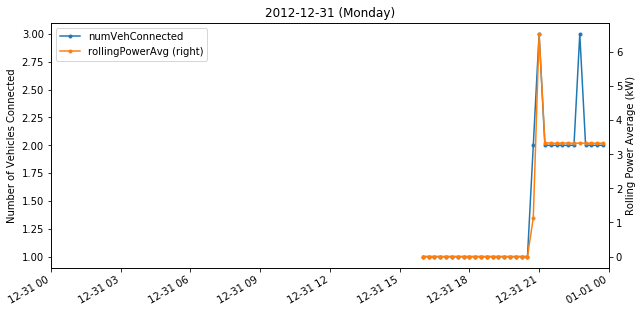

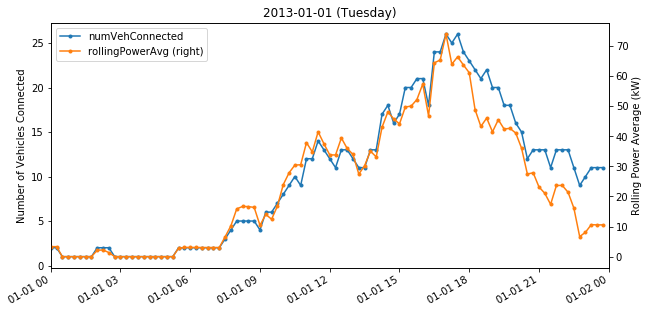

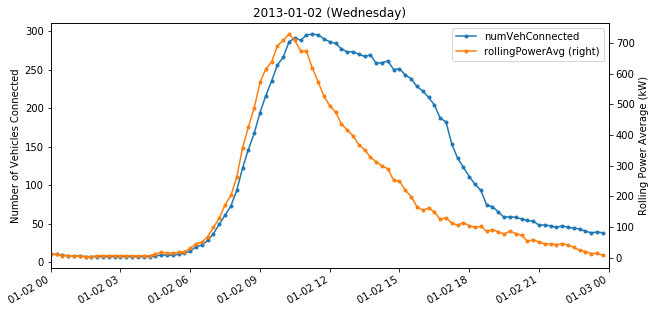

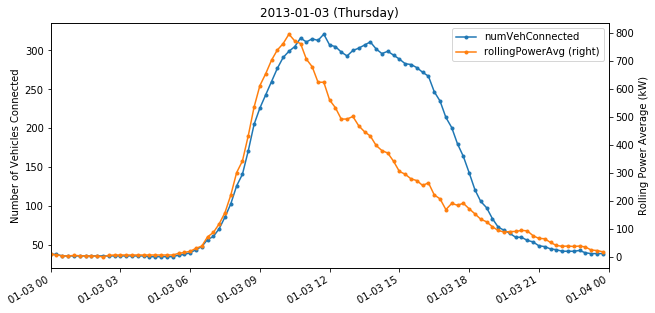

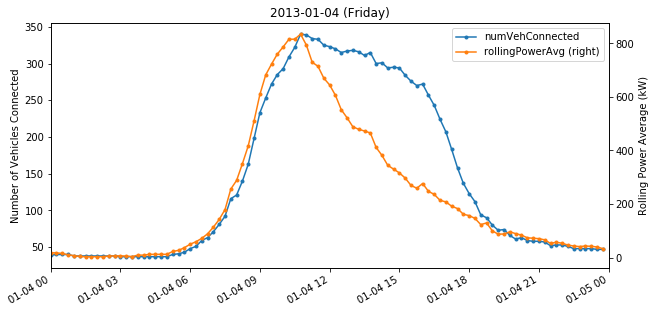

...

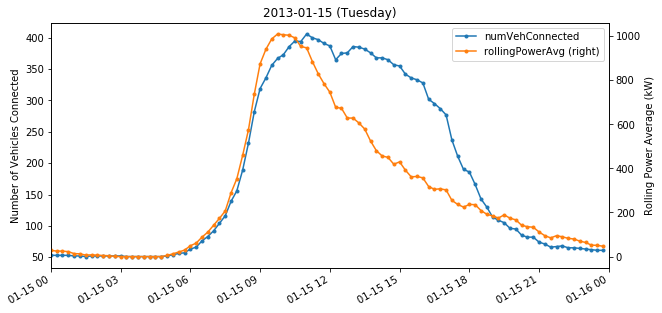

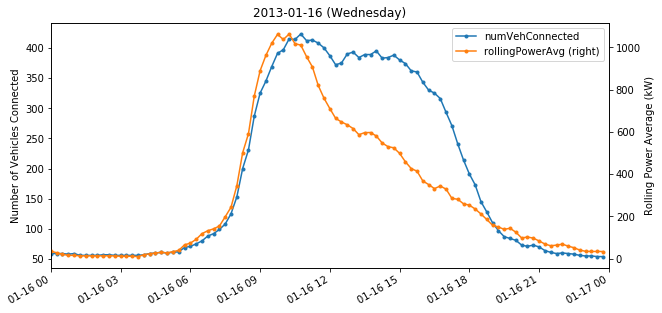

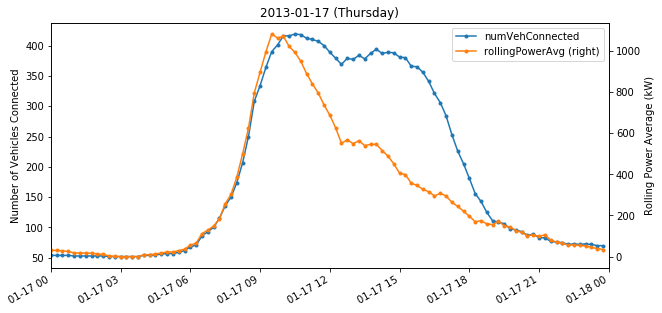

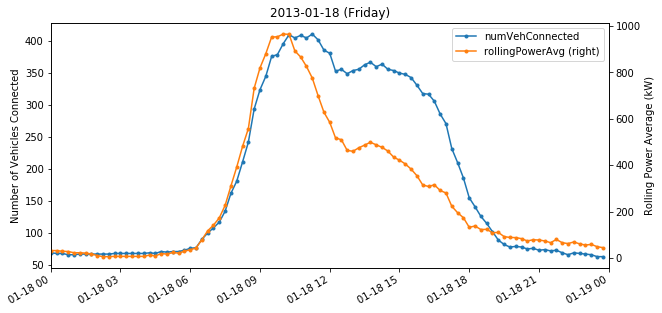

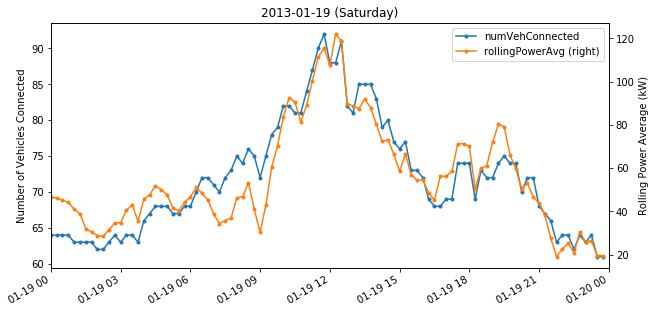

In [18]:
'''9 Bay Area Counties'''
### Alameda ###
# Emeryville, Dublin, Alameda, Fremont, Pleasanton, Oakland, Hayward, San Leandro,
# Newark, Livermore, Berkeley

### Contra Costa ###
# Lafayette, Walnut Creek, Concord, Pleasant Hill, Brentwood, Pittsburg, Martinez,
# Richmond, San Ramon, San Pablo, El Cerrito

### Marin ###
# San Rafael, Mill Valley, Tiburon, Novato, Sausalito, Larkspur, Fairfax

### Napa ###
# Napa, American Canyon, St Helena

### San Francisco ###
# San Francisco, SF

### San Mateo ###
# Menlo Park, South San Francisco, San Mateo, Redwood City,
# San Bruno, Portola Valley, Belmont, Atherton, Millbrae

### Santa Clara ###
# Santa Clara, Campbell, Mountain View, San Jose, Los Altos Hills, Milpitas, Saratoga,
# Cupertino, Palo Alto, Los Gatos, Sunnyvale, Stanford, Los Altos

### Solano ###
# Vacaville, Vallejo, Benicia

### Sonoma ###
# Sonoma, Geyserville, Santa Rosa, Cotati, Healdsburg, Sebastopol, Rohnert Park,
# Petaluma, Windsor

### Other ###
# Folsom, Anaheim, Solvang, Roseville, Patterson, Davis, Ventura, Monterey,
# Santa Cruz, Aptos, Santa Barbara, Capitola, Seaside, West Sacramento, Scotts Valley,
# Rocklin, Castroville, Chico, Lompoc, Salinas, Granite Bay, Carmel, Sacramento, 
# King City, Eureka, Santa Maria, Hollister, Fullerton, Watsonville, Lincoln,
# Visalia, Pacific Grove, Lodi, Manteca 


# zipcodes = CP_df.loc[CP_df['city'].isin(['Santa Clara', 'Campbell', 'Mountain View', 'San Jose', 'Los Altos Hills', 'Milpitas', 'Saratoga',
# 'Cupertino', 'Palo Alto', 'Los Gatos', 'Sunnyvale', 'Stanford', 'Los Altos']), 'zip'].unique()
# daily_charging_plots(CP_df, zipcodes=zipcodes, mode='numVehConnected')

daily_charging_plots(CP_df, VAPs=['P2', 'P2-SB', 'SB'], mode='numVehConnected')

In [19]:
### List of California holidays:
# 01-01*: New Year's Day
# 01 3rd M: MLK Jr. Day
# 02 3rd M: George Washington's Birthday / Presidents' Day
# 03-31*: Cesar Chavez Day
# 05 last M: Memorial Day
# 07-04*: Independence Day
# 09 1st M: Labor Day
# 10 2nd M: Colubms Day
# 11-11*: Veterans Day
# 11 4th Th: Thanksgiving Day
# 12-25*: Christmas Day

# *If on weekend, move to nearest weekday

# Also:
# 02-12: Lincoln Day
# 03, 04: Good Friday, day varies
# 09-09: Admission Day

# Not listed:
# 12-24: Christmas Eve
# 12-31: New Year's Eve

# Load and Preprocess - M. Pertl's Paper on EV aggregation for demand and flexibility forecast

In [38]:
CP_EVflex_df = CP_df.loc[(CP_df['VAP'].isin(['P2', 'SB', 'P2-SB', 'SF'])) & CP_df['energy'] > 0.1, ['startTime', 'endTime', 'energy', 'intervals']]

In [39]:
CP_EVflex_df.loc[:, 'startTime'] = pd.to_datetime(CP_EVflex_df['startTime'])
CP_EVflex_df.loc[:, 'endTime'] = pd.to_datetime(CP_EVflex_df['endTime'])

In [40]:
drop_indices = CP_EVflex_df[(CP_EVflex_df.startTime < pd.to_datetime('2013')) |
                                             (CP_EVflex_df.endTime < pd.to_datetime('2013')) |
                                             (CP_EVflex_df.startTime >= pd.to_datetime('2014-01-01')) |
                                             (CP_EVflex_df.endTime >= pd.to_datetime('2014-01-01'))].index
if len(drop_indices) != 0:
    old_len = len(CP_EVflex_df)
    CP_EVflex_df = CP_EVflex_df.drop(drop_indices)
    print('Data cleaning: {} erroneous date labels (labels not in year 2013).'.format(old_len - len(CP_EVflex_df)))


Data cleaning: 377 erroneous date labels (labels not in year 2013).


In [41]:
def floor_interval(input_dt):
    in_minute = input_dt.minute
    if in_minute >= 0 and in_minute < 15:
        return input_dt.replace(minute=0, second=0)
    elif in_minute >= 15 and in_minute < 30:
        return input_dt.replace(minute=15, second=0)
    elif in_minute >= 30 and in_minute < 45:
        return input_dt.replace(minute=30, second=0)
    else:
        return input_dt.replace(minute=45, second=0)

def ceil_interval(input_dt):
    in_minute = input_dt.minute
    if in_minute > 0 and in_minute <= 15:
        return input_dt.replace(minute=15, second=0)
    elif in_minute > 15 and in_minute <= 30:
        return input_dt.replace(minute=30, second=0)
    elif in_minute > 30 and in_minute <= 45:
        return input_dt.replace(minute=45, second=0)
    elif in_minute == 0:
        return input_dt.replace(second=0)
    else:
        delta_min = 60 - in_minute
        return input_dt.replace(second=0) + pd.Timedelta(str(delta_min) + ' minutes')

In [42]:
CP_EVflex_df.loc[:, 'startTime'] = CP_EVflex_df['startTime'].apply(floor_interval)
CP_EVflex_df.loc[:, 'endTime'] = CP_EVflex_df['endTime'].apply(ceil_interval)

In [43]:
CP_EVflex_df

,startTime,endTime,energy,intervals
1,2013-01-01 08:45:00,2013-01-01 10:00:00,7.185141,"[{'energyConsumed': 1.272225, 'rollingPowerAvg..."
3,2013-01-01 10:00:00,2013-01-01 10:45:00,1.183976,"[{'energyConsumed': 0.36841199999999996, 'roll..."
5,2013-01-01 04:45:00,2013-01-01 05:15:00,0.160479,"[{'energyConsumed': 0.018324999999999998, 'rol..."
6,2013-01-01 05:00:00,2013-01-01 08:30:00,11.313373,"[{'energyConsumed': 0.653768, 'rollingPowerAvg..."
7,2013-01-01 15:30:00,2013-01-01 17:15:00,6.330775,"[{'energyConsumed': 0.8540719999999999, 'rolli..."
9,2013-01-01 15:00:00,2013-01-01 17:30:00,10.929480,"[{'energyConsumed': 1.124029, 'rollingPowerAvg..."
13,2013-01-01 17:15:00,2013-01-01 18:15:00,1.979224,"[{'energyConsumed': 0.011849, 'rollingPowerAvg..."
17,2013-01-01 13:30:00,2013-01-01 18:45:00,10.376226,"[{'energyConsumed': 0.43402, 'rollingPowerAvg'..."
19,2013-01-01 17:45:00,2013-01-01 19:15:00,4.129765,"[{'energyConsumed': 0.000701, 'rollingPowerAvg..."
23,2013-01-01 19:00:00,2013-01-01 19:45:00,0.147485,"[{'energyConsumed': 0.003263, 'rollingPowerAvg..."


In [44]:
CP_EVflex_df['intervals'][17]

[{'energyConsumed': 0.43402,
  'peakPower': 3.0986,
  'rollingPowerAvg': 2.7951,
  'stationTime': '2013-01-01T05:35:41-08:00'},
 {'energyConsumed': 1.1977039999999999,
  'peakPower': 3.0599,
  'rollingPowerAvg': 3.0547,
  'stationTime': '2013-01-01T05:45:00-08:00'},
 {'energyConsumed': 1.96299,
  'peakPower': 3.0698,
  'rollingPowerAvg': 3.0611,
  'stationTime': '2013-01-01T06:00:00-08:00'},
 {'energyConsumed': 2.7224269999999997,
  'peakPower': 3.099,
  'rollingPowerAvg': 3.0377,
  'stationTime': '2013-01-01T06:15:00-08:00'},
 {'energyConsumed': 3.481229,
  'peakPower': 3.0516,
  'rollingPowerAvg': 3.0352,
  'stationTime': '2013-01-01T06:30:00-08:00'},
 {'energyConsumed': 4.237632,
  'peakPower': 3.089,
  'rollingPowerAvg': 3.0256,
  'stationTime': '2013-01-01T06:45:00-08:00'},
 {'energyConsumed': 4.9949580000000005,
  'peakPower': 3.0504,
  'rollingPowerAvg': 3.0293,
  'stationTime': '2013-01-01T07:00:00-08:00'},
 {'energyConsumed': 5.753536,
  'peakPower': 3.0876,
  'rollingPowerAvg

In [45]:
print(CP_EVflex_df.startTime.min())
print(CP_EVflex_df.endTime.max())

2013-01-01 04:45:00
2014-01-01 00:00:00


In [46]:
storage_params_dict = {}

lim = 10000

for session in CP_EVflex_df.itertuples():
    if lim <= 0:
        break
#     alph = session.energy
#     beta = -1.0 * alph
    prev_energyConsumed = 0
    
    intervals = sorted(session.intervals, key=lambda k: k['energyConsumed']) 
    
    temp = 0
    if not intervals:
        start_Pact = 0
        start_P_deltat = 0
        alph = 0
    else:
        start_Pact = intervals[0]['rollingPowerAvg']
        start_P_deltat = round(intervals[0]['energyConsumed'], 3)
        temp += start_P_deltat
        prev_energyConsumed = intervals[0]['energyConsumed']
    
    for idx, interval in enumerate(intervals):
        if idx == 0:
            continue
        else:
            ts = pd.to_datetime(interval['stationTime'])
            Pact = interval['rollingPowerAvg']
            P_deltat = round(interval['energyConsumed'] - prev_energyConsumed, 3)
            temp += P_deltat
            prev_energyConsumed = interval['energyConsumed']
            
            storage_params_dict[ts] = list(map(add, storage_params_dict.get(ts, [0, 0, 0, 0, 0, 0, 0]),
                                               [0, 0, 0, P_deltat, Pact, 0, 6.6]))
            
    alph = temp
    beta = -1 * alph
    
    storage_params_dict[session.startTime] = list(map(add, storage_params_dict.get(session.startTime, [0, 0, 0, 0, 0, 0, 0]),
                                               [alph, 0, 0, start_P_deltat, start_Pact, 0, 6.6]))
    
    storage_params_dict[session.endTime] = list(map(add, storage_params_dict.get(session.endTime, [0, 0, 0, 0, 0, 0, 0]),
                                               [0, beta, 0, 0, 0, 0, 0]))
    
    lim -= 1

storage_params_df = pd.DataFrame.from_dict(storage_params_dict, orient='index',
                                           columns=['alph', 'beta', 'C', 'Cact', 'Pact', 'Pmin', 'Pmax'])
storage_params_df.index = pd.to_datetime(storage_params_df.index) #redundant?

drop_indices = storage_params_df[(storage_params_df.index < pd.to_datetime('2013')) |
                                                            (storage_params_df.index >= pd.to_datetime('2014-01-01'))].index
if len(drop_indices) != 0:
    old_len = len(storage_params_df)
    storage_params_df = storage_params_df.drop(drop_indices)
    print('Data cleaning: {} erroneous date labels (labels not in year 2013).'.format(old_len - len(storage_params_df)))

Data cleaning: 6334 erroneous date labels (labels not in year 2013).


In [47]:
storage_params_df = storage_params_df.sort_index()

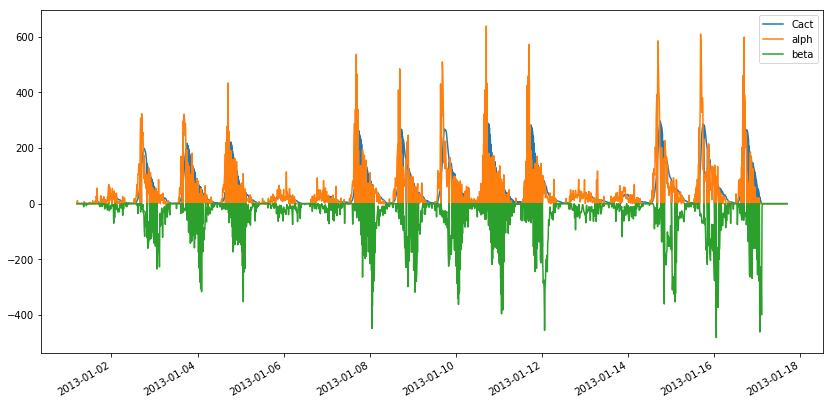

In [48]:
storage_params_df[['Cact', 'alph', 'beta']].plot(figsize=(14,7))

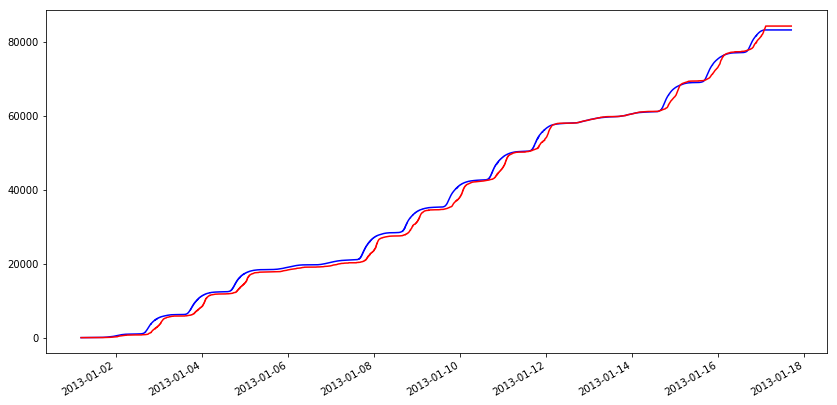

In [49]:
plt.figure(figsize=(14,7))
storage_params_df['Cact'].cumsum().plot(style='b')
(-1*storage_params_df['beta']).cumsum().plot(style='r')

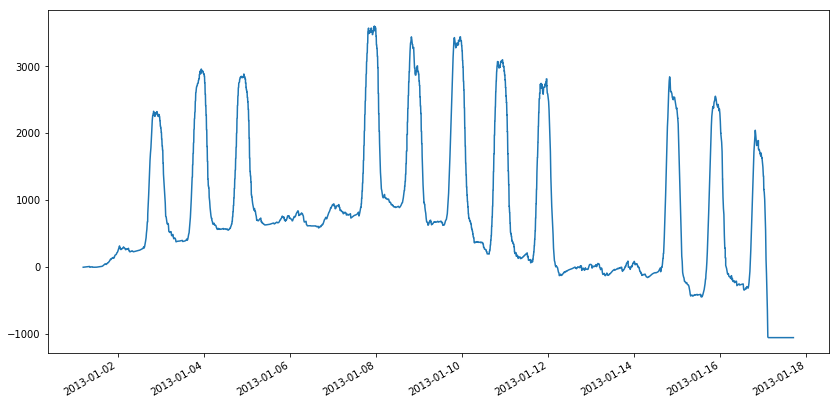

In [50]:
(storage_params_df['beta'].cumsum() + storage_params_df['Cact'].cumsum()).plot(figsize=(14,7))

In [51]:
print(sum(storage_params_df['Cact']))
print(sum(storage_params_df['alph']))

83153.80100000023
84204.61600000002


In [52]:
#storage_params_df = storage_params_df.resample('15T').mean().dropna().tz_localize(pytz.utc).tz_convert(pytz.timezone('US/Pacific'))
# storage_params_df

In [53]:
storage_params_df['C'] = storage_params_df['alph'].cumsum() + storage_params_df['beta'].cumsum()
# storage_params_df['Cact'] = cumtrapz(storage_params_df['Pact'], x=storage_params_df.index.astype(np.int64) / 10**9 / 3600, initial=0) + storage_params_df['beta'].cumsum()
storage_params_df['Cact'] = storage_params_df['Cact'].cumsum() + storage_params_df['beta'].cumsum()

Text(0,0.5,'Power (kW)')

<Figure size 432x288 with 0 Axes>

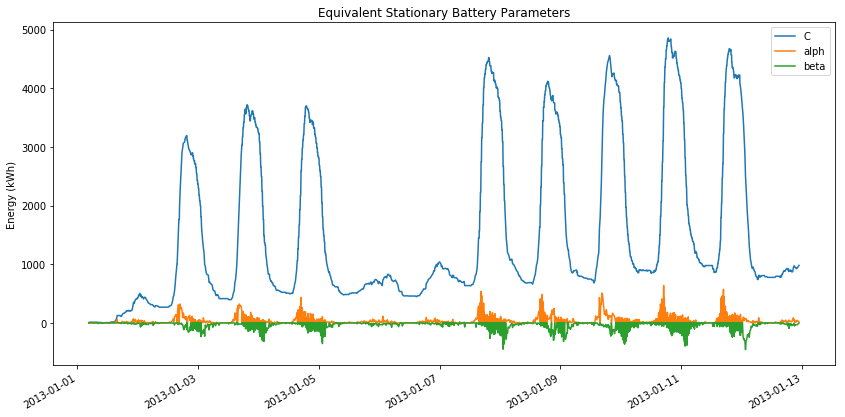

<Figure size 432x288 with 0 Axes>

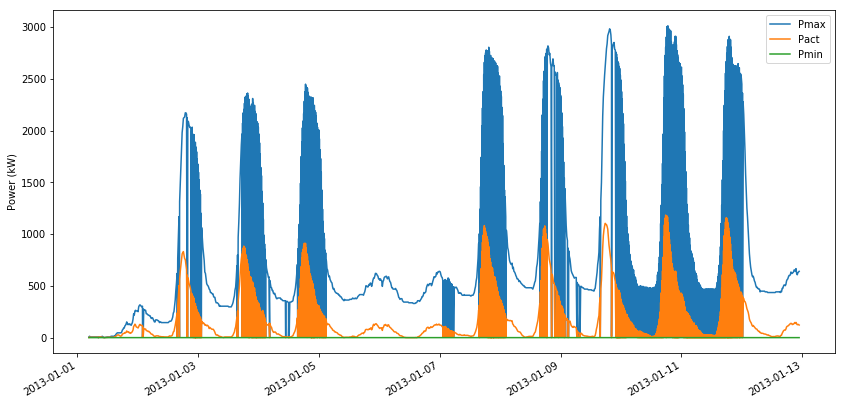

In [66]:
plt.figure()
# storage_params_df[['C', 'Cact', 'alph', 'beta']].head(2100).plot(figsize=(14,7), title='Equivalent Stationary Battery Parameters')
storage_params_df[['C', 'alph', 'beta']].head(2100).plot(figsize=(14,7), title='Equivalent Stationary Battery Parameters')
plt.ylabel('Energy (kWh)')

plt.figure()
storage_params_df[['Pmax', 'Pact', 'Pmin']].head(2100).plot(figsize=(14,7))
plt.ylabel('Power (kW)')